In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import KBinsDiscretizer,FunctionTransformer,StandardScaler
from sklearn.feature_selection import VarianceThreshold

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df= pd.read_csv('/content/drive/MyDrive/dataset_full.csv')

##Data exploration

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
df.sample(5)

,qty_dot_url,qty_hyphen_url,qty_underline_url,qty_slash_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_percent_url,qty_tld_url,length_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,qty_vowels_domain,domain_length,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_percent_directory,directory_length,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_percent_file,file_length,qty_dot_params,qty_hyphen_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,qty_percent_params,params_length,tld_present_params,qty_params,email_in_url,time_response,domain_spf,asn_ip,time_domain_activation,time_domain_expiration,qty_ip_resolved,qty_nameservers,qty_mx_servers,ttl_hostname,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened,phishing
75891,2,0,0,4,0,1,0,0,0,0,0,0,0,0,0,0,0,1,50,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,16,0,0,1,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,27,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,7,0,1,0,2.116523,1,20013,1997,559,1,2,1,6754,1,0,0,0,0,1
66919,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,24,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8,24,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,1.367170,0,13335,-1,-1,5,2,1,291,1,0,0,0,0,0
27060,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,21,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,21,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,1.123901,0,26347,6918,21,1,3,0,14398,1,0,0,0,0,0
16445,2,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,2,44,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,16,0,0,1,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,0.488616,-1,263753,3517,162,1,4,1,10137,0,1,0,0,0,1
7934,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,17,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,17,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,1.375307,0,57168,6907,32,1,2,1,598,1,1,0,0,0,0


In [ ]:
df.shape

(88647, 112)

In [ ]:
numerical_feature = [feature for feature in df.columns if df[feature].dtypes != 'O']
len(numerical_feature)

112

In [ ]:
categorical_features = df.select_dtypes(include=['object', 'category']).columns.tolist()
len(categorical_features)

0

In [ ]:
discrete_features = [feature for feature in numerical_feature if len(df[feature].unique()) < 25 and all(isinstance(val, int) for val in df[feature])]
len(discrete_features)

94

In [ ]:
continuous_features = [feature for feature in numerical_feature if feature not in discrete_features]
len(continuous_features)

18

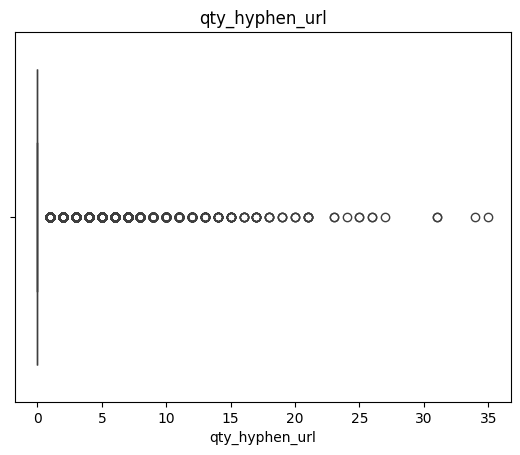

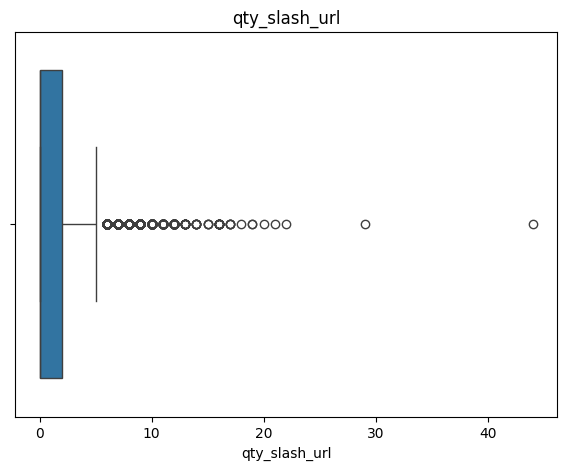

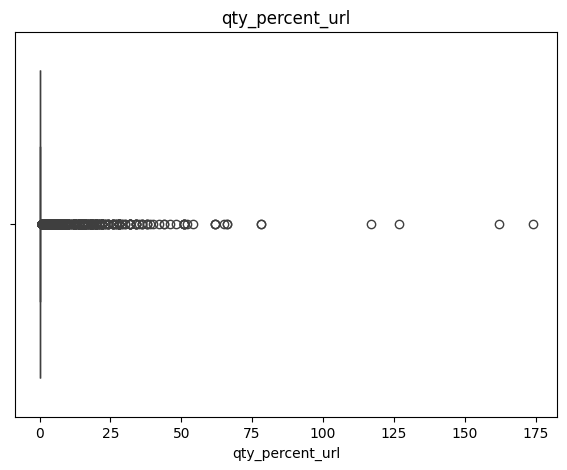

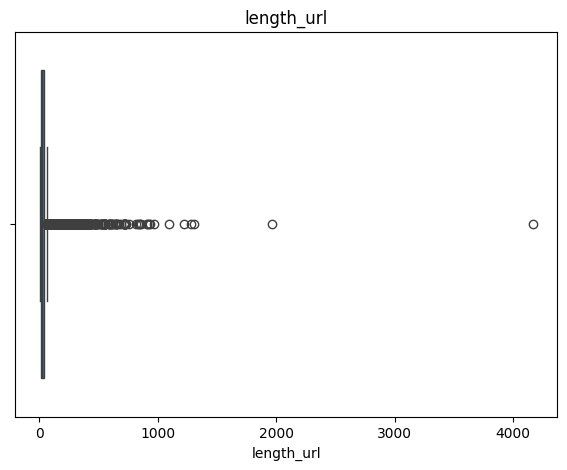

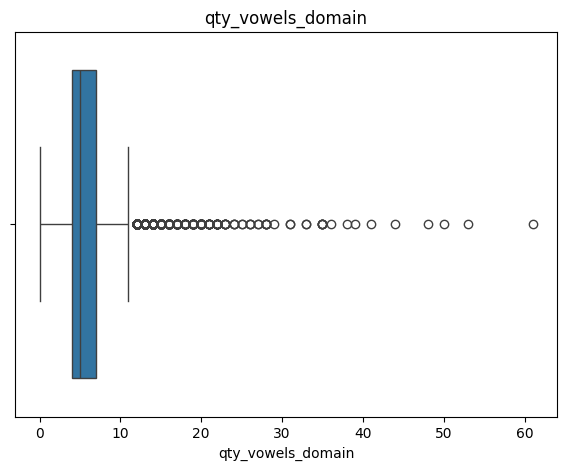

...

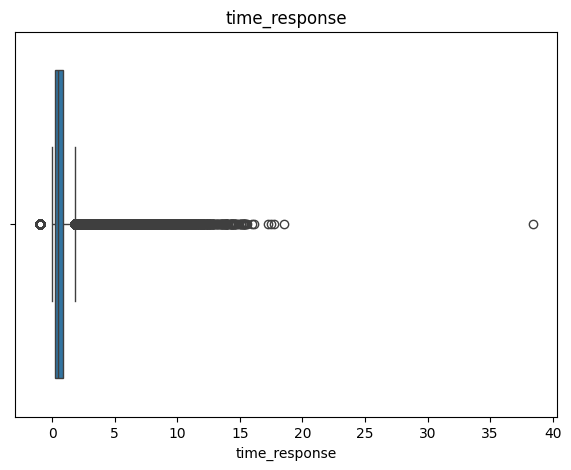

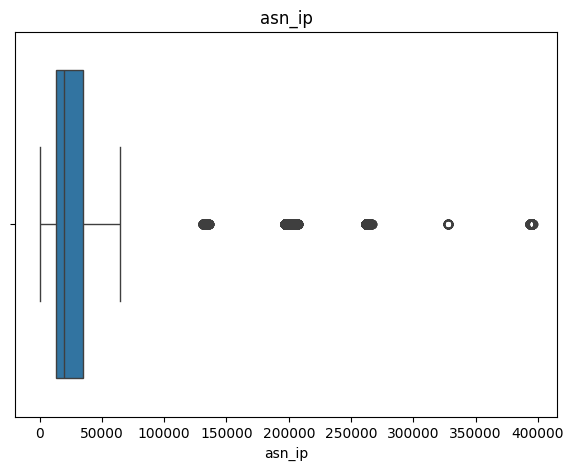

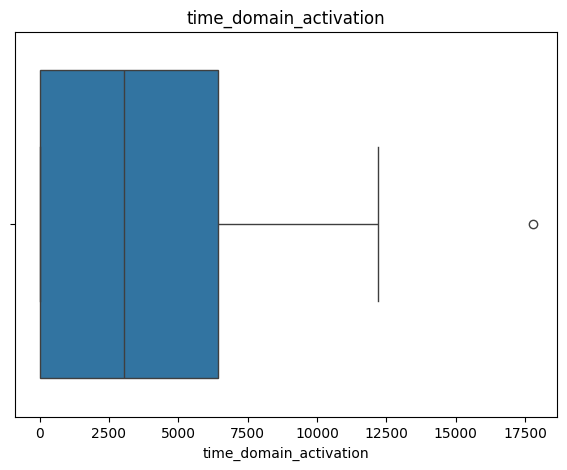

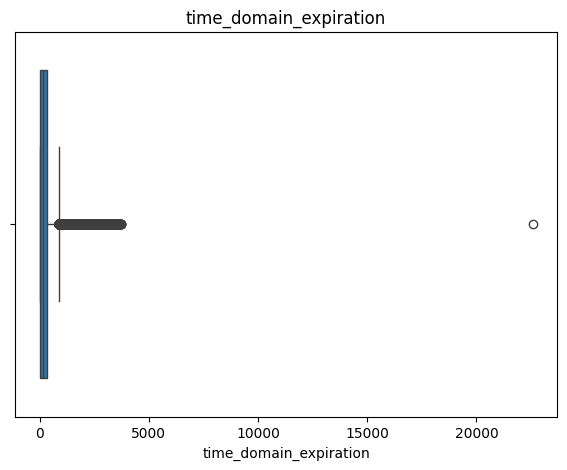

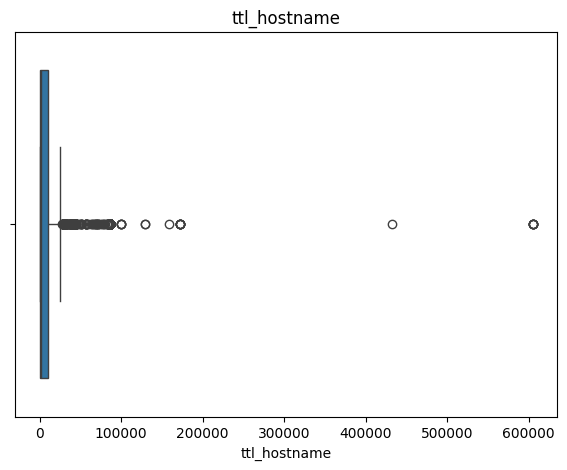

<Figure size 700x500 with 0 Axes>

In [ ]:
#Checking outliers in continuous features
for feature in continuous_features:
    data=df.copy()
    sns.boxplot(x=data[feature])
    plt.title(feature)
    plt.figure(figsize=(7,5))

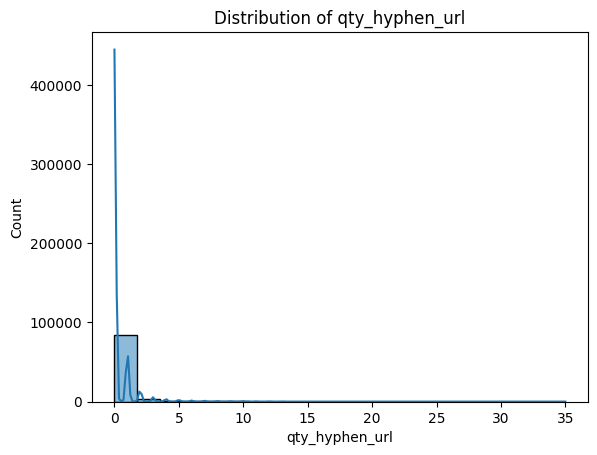

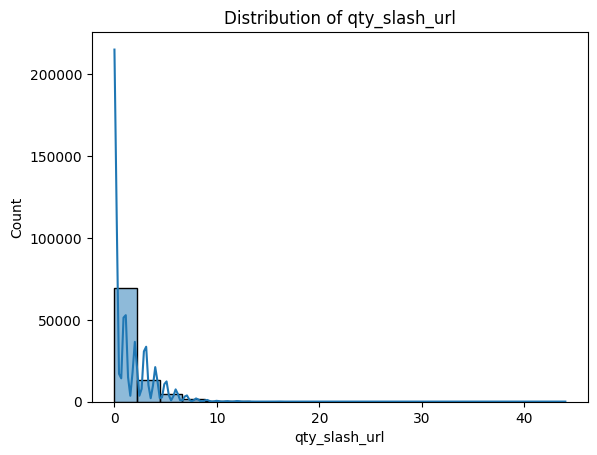

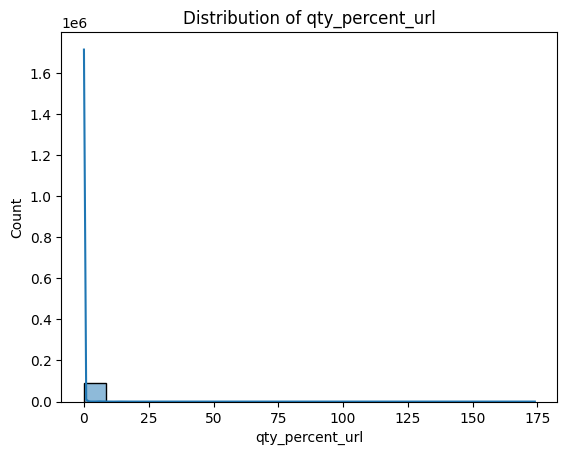

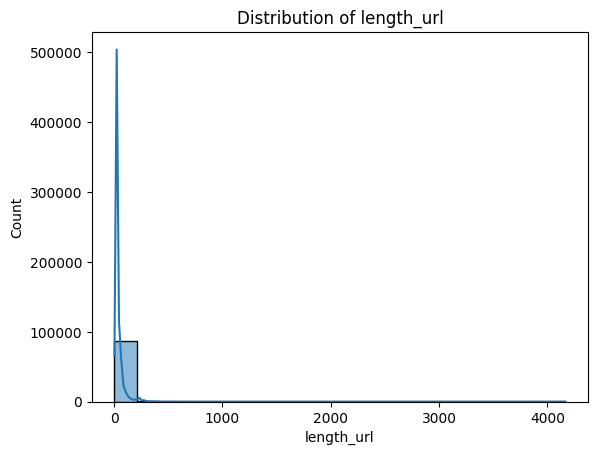

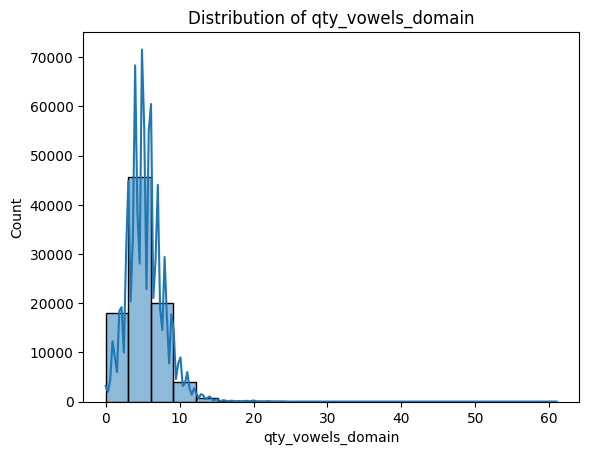

...

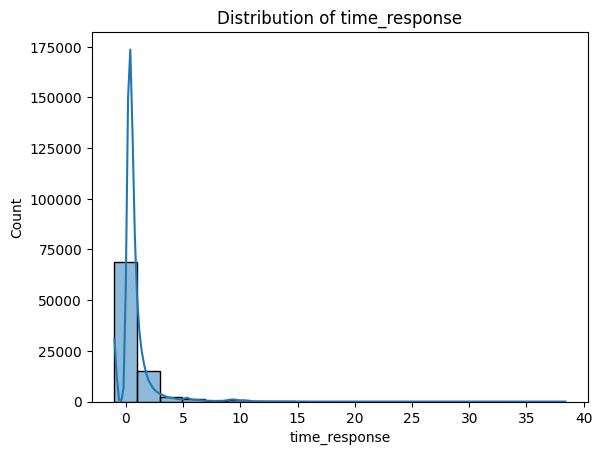

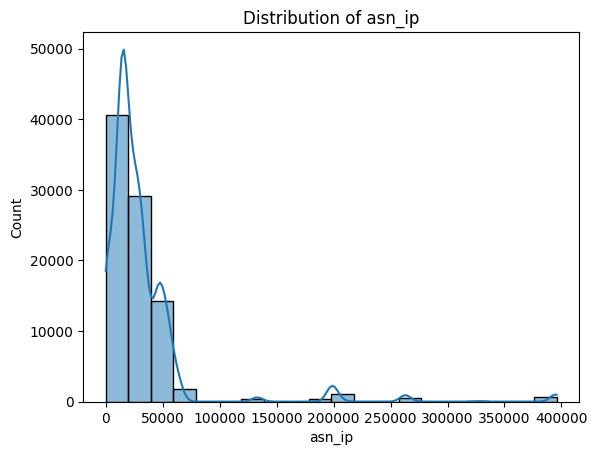

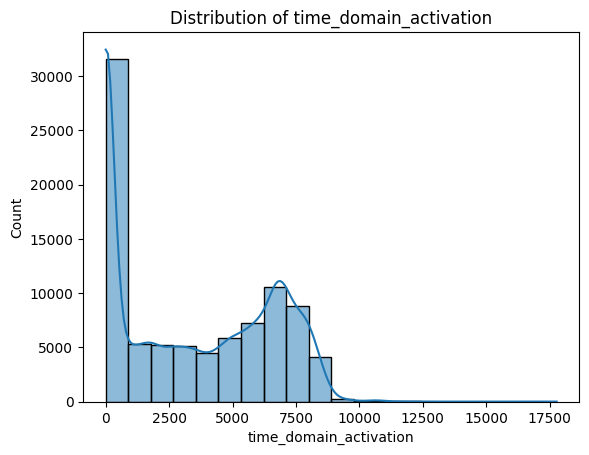

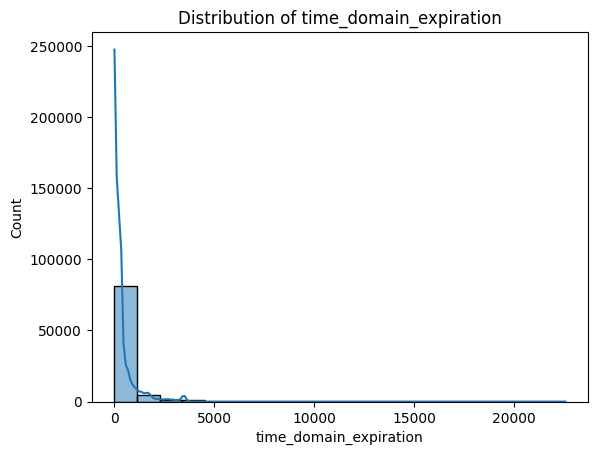

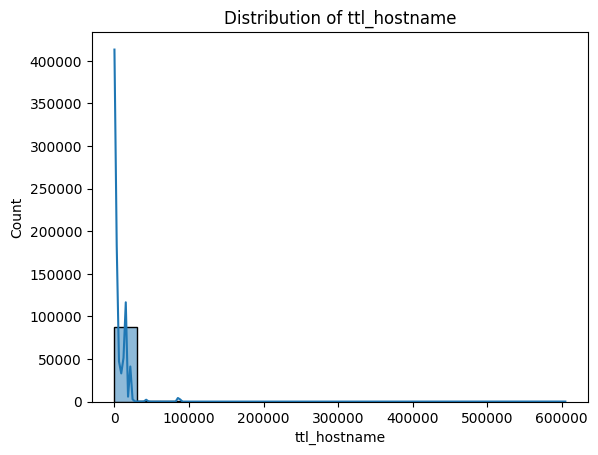

In [ ]:
for feature in continuous_features:
    plt.figure()
    sns.histplot(df[feature], bins=20, kde=True, edgecolor='black')
    plt.title(f'Distribution of {feature}')
    plt.show()

In [ ]:
for feature in continuous_features:
  skewness = df[feature].skew()
  print(f"Skewness of {feature}: {skewness}")

Skewness of qty_hyphen_url: 8.056218991421861
Skewness of qty_slash_url: 2.0446500309033704
Skewness of qty_percent_url: 43.017301392360004
Skewness of length_url: 14.001016768032272
Skewness of qty_vowels_domain: 1.488365946946405
Skewness of domain_length: 3.6146744480000645
Skewness of qty_percent_directory: 54.9157332181715
Skewness of directory_length: 10.03645590493819
Skewness of qty_percent_file: 61.4516613529171
Skewness of file_length: 34.18842662296652
Skewness of qty_hyphen_params: 19.377570877933216
Skewness of qty_percent_params: 25.406943931700617
Skewness of params_length: 26.701300426865544
Skewness of time_response: 4.242813424790594
Skewness of asn_ip: 5.228012377372544
Skewness of time_domain_activation: 0.2137945791780786
Skewness of time_domain_expiration: 3.650835627364518
Skewness of ttl_hostname: 13.690012887192164


<ipython-input-17-e0486fae2e13>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(7,5))


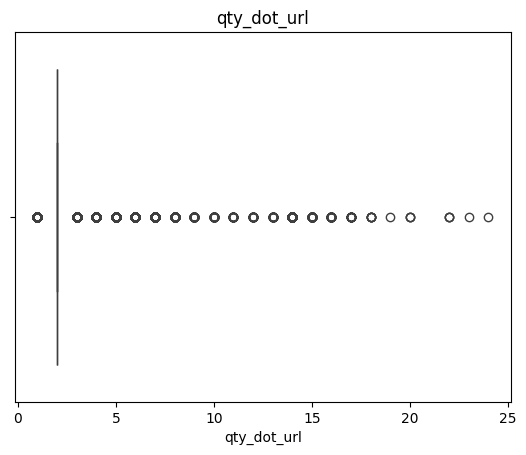

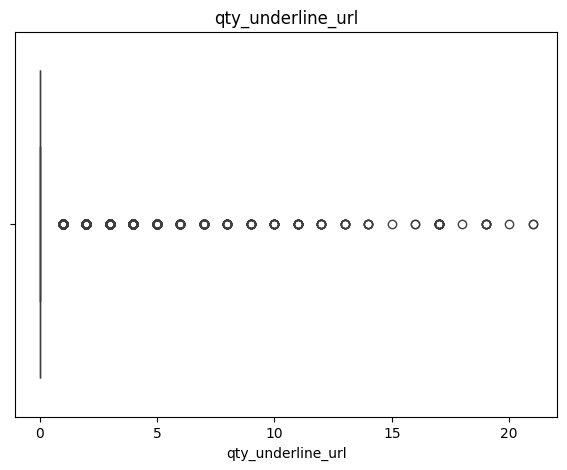

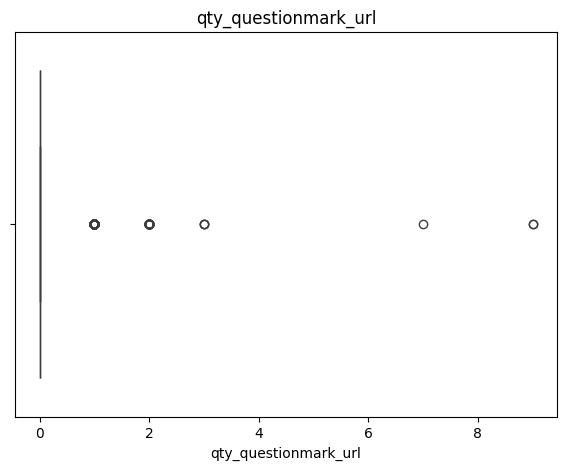

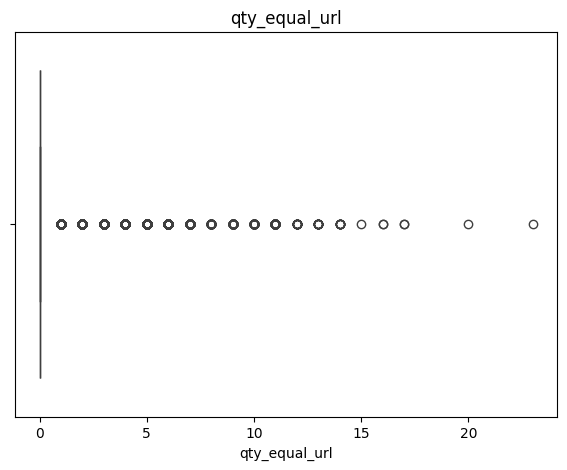

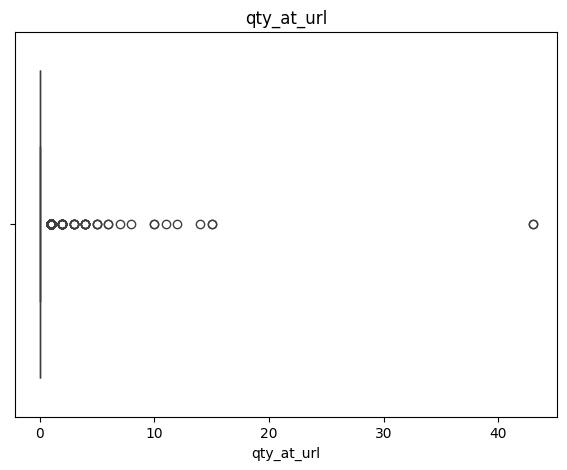

...

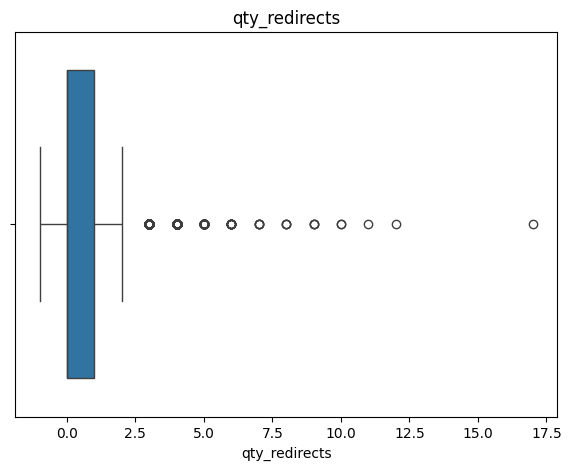

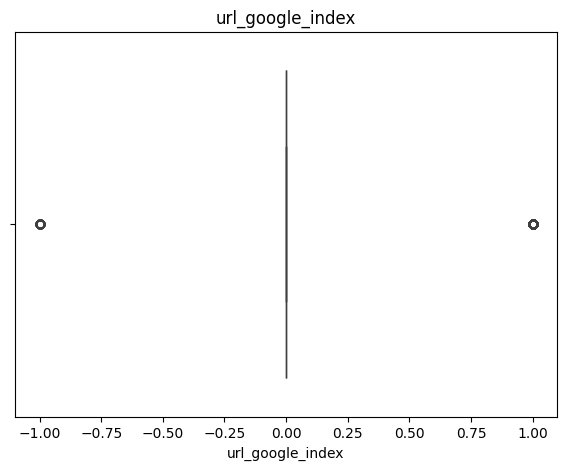

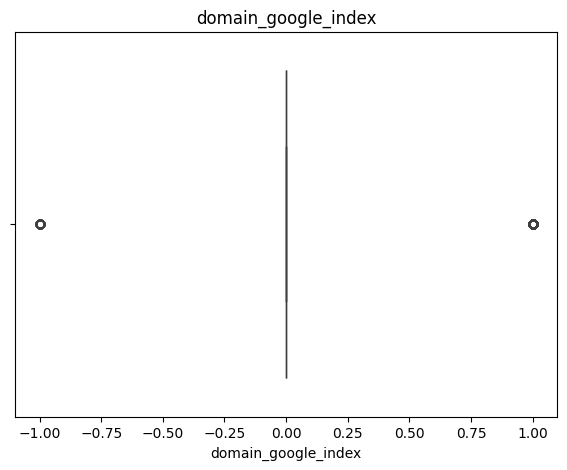

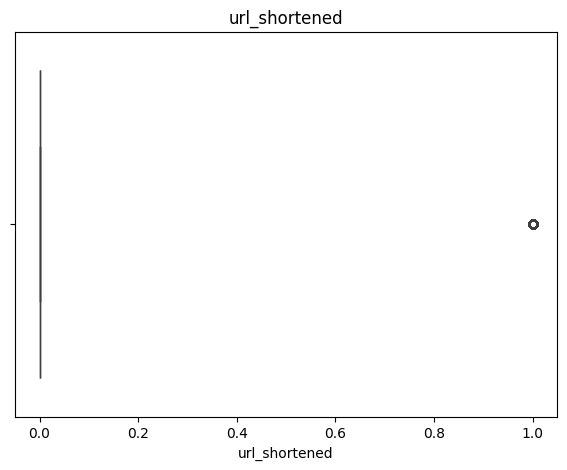

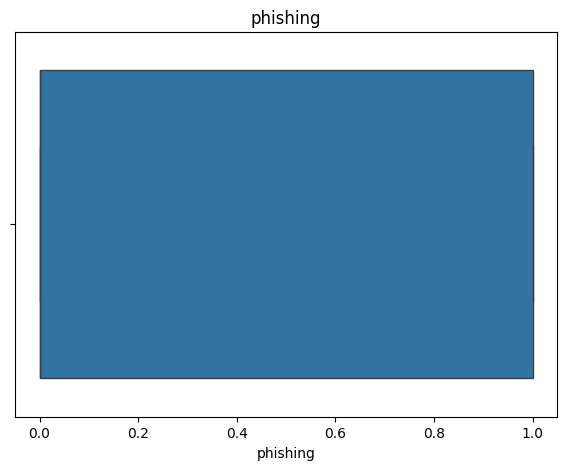

<Figure size 700x500 with 0 Axes>

In [ ]:
#Checking outliers of discreet features
for feature in discrete_features:
    data=df.copy()
    sns.boxplot(x=data[feature])
    plt.title(feature)
    plt.figure(figsize=(7,5))

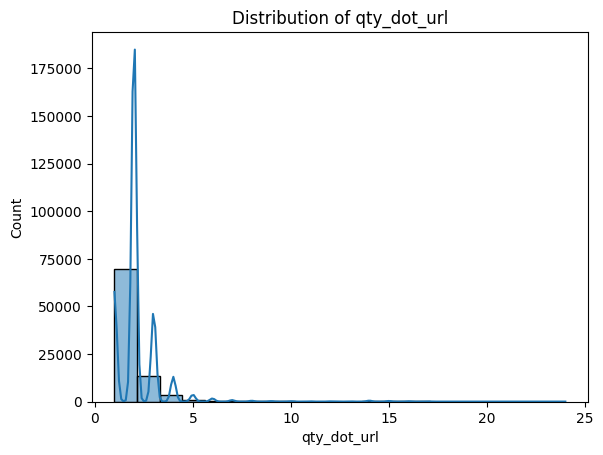

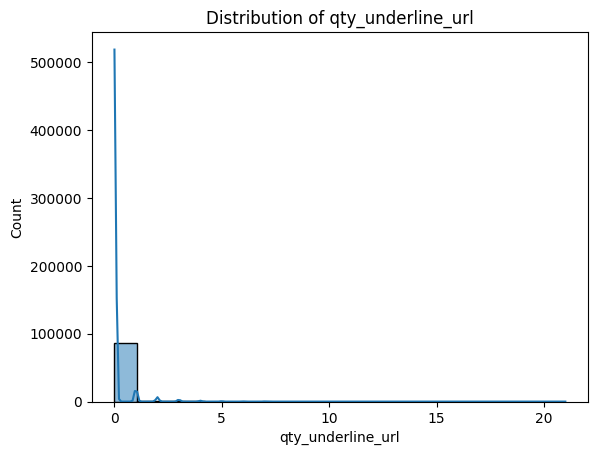

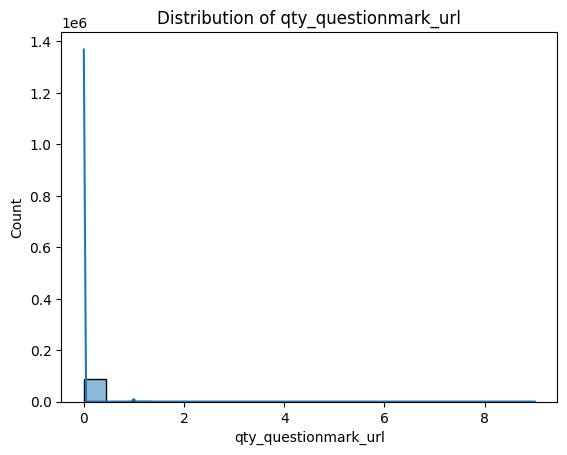

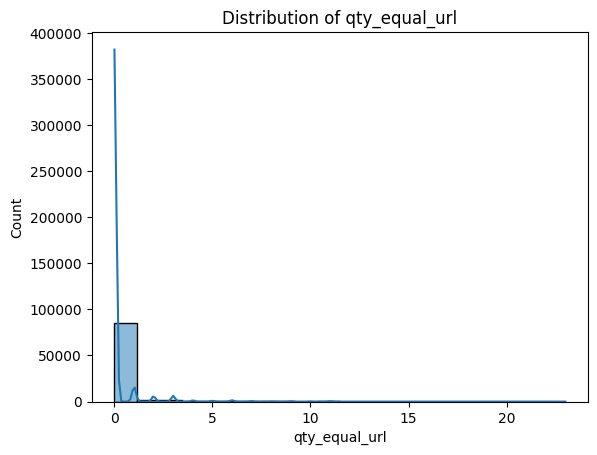

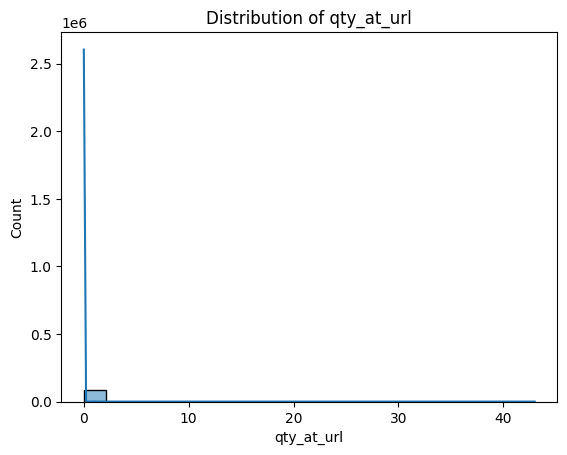

...

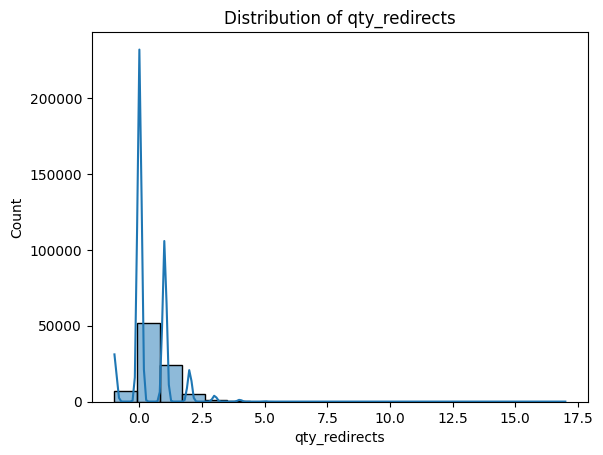

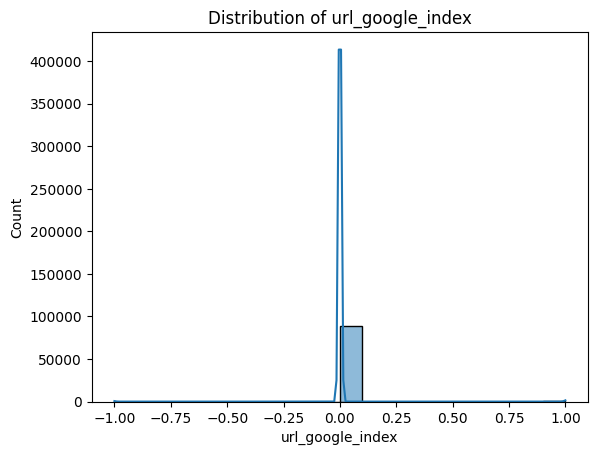

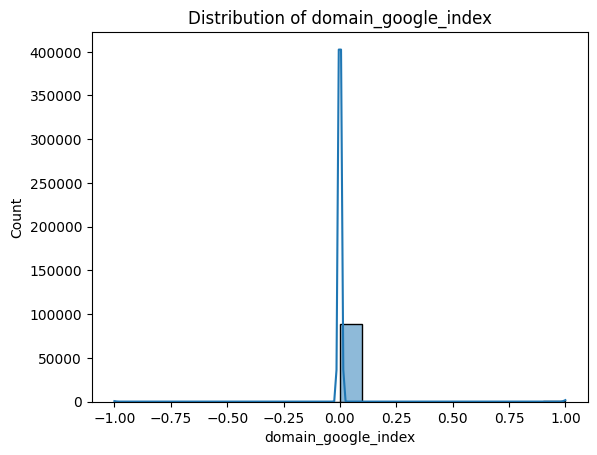

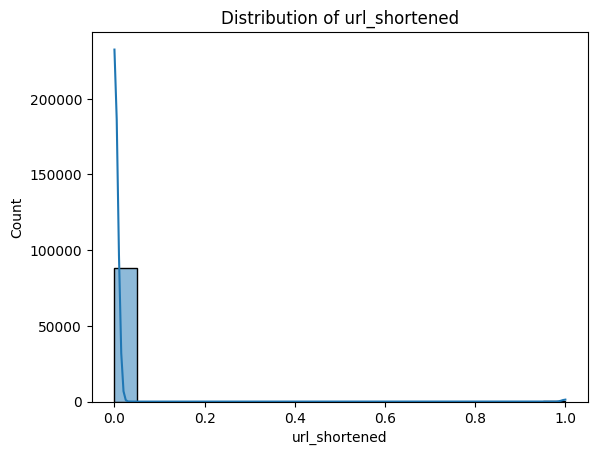

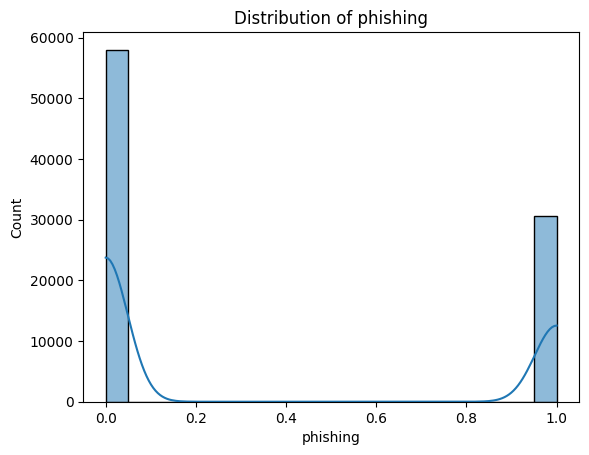

In [ ]:
#Checking the distribution of discrete features
for feature in discrete_features:
    plt.figure()
    sns.histplot(df[feature], bins=20, kde=True, edgecolor='black')
    plt.title(f'Distribution of {feature}')
    plt.show()

In [ ]:
for feature in discrete_features:
  skewness = df[feature].skew()
  print(f"Skewness of {feature}: {skewness}")

Skewness of qty_dot_url: 5.485010916738996
Skewness of qty_underline_url: 12.73059168651888
Skewness of qty_questionmark_url: 23.279151012404313
Skewness of qty_equal_url: 7.3580545859602955
Skewness of qty_at_url: 91.4024950940041
Skewness of qty_and_url: 9.59419232396511
Skewness of qty_exclamation_url: 65.06829212455526
Skewness of qty_space_url: 98.26955452781702
Skewness of qty_tilde_url: 36.874800318198936
Skewness of qty_comma_url: 66.30150598171906
Skewness of qty_plus_url: 87.8611013971801
Skewness of qty_asterisk_url: 120.31182863086946
Skewness of qty_hashtag_url: 162.13378782152634
Skewness of qty_dollar_url: 71.11466905958555
Skewness of qty_tld_url: 6.277247412189617
Skewness of qty_dot_domain: 2.6558683955067974
Skewness of qty_hyphen_domain: 6.00243832965799
Skewness of qty_underline_domain: 50.100263909304566
Skewness of qty_slash_domain: 0
Skewness of qty_questionmark_domain: 0
Skewness of qty_equal_domain: 0
Skewness of qty_at_domain: 297.73646064934684
Skewness of q

In [ ]:
#The features contains outliers and are highly right skewed.

In [ ]:
df['phishing'].value_counts()

phishing
0    58000
1    30647
Name: count, dtype: int64

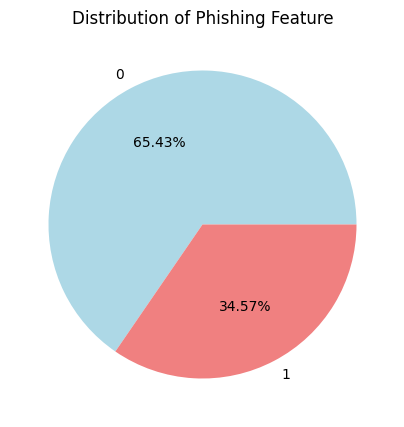

In [ ]:
z=df['phishing'].value_counts()
plt.figure(figsize=(5, 5))
plt.pie(z, labels=z.index,colors=['lightblue', 'lightcoral'],autopct='%1.2f%%')
plt.title('Distribution of Phishing Feature')
plt.show()

##Data splitting

In [ ]:
#Splitting the data before pre-processing to avoid data leakage
train,test = train_test_split(df,test_size=0.30,random_state=44)

In [ ]:
train = train.reset_index(drop=True)
test = test.reset_index(drop=True)

#Data preprocessing and feature engineering

In [ ]:
train.isnull().sum()

qty_dot_url             0
qty_hyphen_url          0
qty_underline_url       0
qty_slash_url           0
qty_questionmark_url    0
                       ..
qty_redirects           0
url_google_index        0
domain_google_index     0
url_shortened           0
phishing                0
Length: 112, dtype: int64

In [ ]:
check_null=[feature for feature in train.columns if train[feature].isnull().sum()>0]
check_null

[]

In [ ]:
imputer = IterativeImputer(random_state=44, max_iter=5)

In [ ]:
train_1 = pd.DataFrame(imputer.fit_transform(train),columns=train.columns)

In [ ]:
test_1 = pd.DataFrame(imputer.transform(test),columns=test.columns)

In [ ]:
train_1.shape

(62052, 112)

In [ ]:
train_1.duplicated().sum()

891

In [ ]:
train_1.drop_duplicates(inplace=True)

In [ ]:
test_1.drop_duplicates(inplace=True)

##Binning of continuous features

In [ ]:
#train_1 does not have phising column

In [ ]:
train_1.describe()

,qty_dot_url,qty_hyphen_url,qty_underline_url,qty_slash_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_percent_url,qty_tld_url,length_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,qty_vowels_domain,domain_length,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_percent_directory,directory_length,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_percent_file,file_length,qty_dot_params,qty_hyphen_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,qty_percent_params,params_length,tld_present_params,qty_params,email_in_url,time_response,domain_spf,asn_ip,time_domain_activation,time_domain_expiration,qty_ip_resolved,qty_nameservers,qty_mx_servers,ttl_hostname,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened,phishing
count,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.0,61161.0,61161.0,61161.000000,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000
mean,2.192901,0.329965,0.116267,1.290921,0.009369,0.209709,0.021403,0.144602,0.003237,0.000752,0.003662,0.001586,0.003156,0.005134,0.000360,0.001978,0.105934,1.047759,36.564984,1.869083,0.116447,0.000850,0.0,0.0,0.0,0.000016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.456238,18.591586,0.002371,0.004627,-0.318520,-0.357728,-0.472066,0.726165,-0.531433,-0.524158,-0.528736,-0.526937,-0.529651,-0.530763,-0.527820,-0.530894,-0.530109,-0.527019,-0.531433,-0.530060,-0.482889,10.946976,-0.363565,-0.472425,-0.505126,-0.531433,-0.531433,-0.529733,-0.531057,-0.530109,-0.530354,-0.531090,-0.531057,-0.531025,-0.530469,-0.529766,-0.531433,-0.531433,-0.497098,2.820278,-0.807933,-0.876980,-0.860499,-0.8

In [ ]:
# Separate continuous features from training and test data
continuous_train_df = train_1[continuous_features]
continuous_test_df = test_1[continuous_features]

# Initialize a dictionary to store the binned features discretizers
binned_discretizers = {}
binned_train_features_dict = {}
binned_test_features_dict = {}

# Iterate over each feature in the continuous features DataFrame
for feature in continuous_train_df.columns:
    max_value = continuous_train_df[feature].max()

    # Determine the number of bins based on the max value of the feature
    if max_value <= 100:
        n_bins = 5
    elif max_value <= 1000:
        n_bins = 10
    elif max_value <= 10000:
        n_bins = 15
    else:
        n_bins = 25

    # Initialize the KBinsDiscretizer for the current feature
    quantile_binner = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='quantile')

    # Fit the discretizer on the training data and transform both train and test data
    binned_train_feature = quantile_binner.fit_transform(continuous_train_df[[feature]])
    binned_test_feature = quantile_binner.transform(continuous_test_df[[feature]])

    # Store the discretizer
    binned_discretizers[feature] = quantile_binner

    # Add the binned features to the dictionaries
    binned_train_features_dict[feature] = binned_train_feature.flatten()
    binned_test_features_dict[feature] = binned_test_feature.flatten()

# Create DataFrames from the binned features dictionaries
binned_train_df = pd.DataFrame(binned_train_features_dict)
binned_test_df = pd.DataFrame(binned_test_features_dict)

# Optionally, merge the binned features with the other features in the original DataFrames
train_1_binned = train_1.drop(columns=continuous_features).reset_index(drop=True)
train_1_binned = pd.concat([train_1_binned, binned_train_df], axis=1)

test_1_binned = test_1.drop(columns=continuous_features).reset_index(drop=True)
test_1_binned = pd.concat([test_1_binned, binned_test_df], axis=1)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_discretization.py:279: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_discretization.py:279: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_discretization.py:279: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_discretization.py:279: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_discretization.py:279

In [ ]:
continuous_train_df.describe()

,qty_hyphen_url,qty_slash_url,qty_percent_url,length_url,qty_vowels_domain,domain_length,qty_percent_directory,directory_length,qty_percent_file,file_length,qty_hyphen_params,qty_percent_params,params_length,time_response,asn_ip,time_domain_activation,time_domain_expiration,ttl_hostname
count,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000
mean,0.329965,1.290921,0.105934,36.564984,5.456238,18.591586,-0.482889,10.946976,-0.497098,2.820278,-0.876980,-0.858962,5.373342,0.824192,31452.755596,3416.871307,354.846454,6186.465297
std,1.127398,1.897938,1.616061,47.408498,2.537247,6.633234,1.395219,24.830365,1.341761,14.414116,0.642031,1.068634,36.226287,1.478595,45152.192558,3039.627598,602.344204,10570.060820
min,0.000000,0.000000,0.000000,4.000000,0.000000,4.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,0.000000,0.000000,0.000000,17.000000,4.000000,14.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.248404,13335.000000,-1.000000,-1.000000,292.000000
50%,0.000000,0.000000,0.000000,22.000000,5.000000,18.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.474067,20401.000000,3103.000000,172.000000,2477.000000
75%,0.000000,2.000000,0.000000,39.000000,7.000000,22.000000,0.000000,17.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.887955,35415.000000,6443.000000,355.000000,10883.000000
max,34.000000,44.000000,162.000000,4165.000000,61.000000,231.000000,162.000000,1286.000000,162.000000,1232.000000,34.000000,52.000000,4094.000000,38.402411,395754.000000,17775.000000,22574.000000,604790.000000


In [ ]:
binned_train_df.describe()

,qty_hyphen_url,qty_slash_url,qty_percent_url,length_url,qty_vowels_domain,domain_length,qty_percent_directory,directory_length,qty_percent_file,file_length,qty_hyphen_params,qty_percent_params,params_length,time_response,asn_ip,time_domain_activation,time_domain_expiration,ttl_hostname
count,61161.0,61161.000000,61161.0,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.0,61161.0,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000
mean,0.0,0.690865,0.0,7.232321,2.278756,4.781478,0.468567,1.488661,0.468567,0.917333,0.0,0.0,0.067314,2.000033,9.734962,6.841598,6.129118,12.088161
std,0.0,0.811282,0.0,4.177965,1.367344,2.848188,0.499015,2.010772,0.499015,1.260171,0.0,0.0,0.250567,1.414237,6.459541,6.129808,5.825997,7.200977
min,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,0.000000,0.0,4.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,1.000000,4.000000,0.000000,0.000000,6.000000
50%,0.0,0.000000,0.0,7.000000,2.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,2.000000,9.000000,6.000000,5.000000,12.000000
75%,0.0,1.000000,0.0,11.000000,4.000000,7.000000,1.000000,3.000000,1.000000,1.000000,0.0,0.0,0.000000,3.000000,15.000000,12.000000,11.000000,18.000000
max,0.0,2.000000,0.0,14.000000,4.000000,9.000000,1.000000,6.000000,1.000000,4.000000,0.0,0.0,1.000000,4.000000,21.000000,18.000000,17.000000,24.000000


In [ ]:
for feature in continuous_features:
  skewness = train_1[feature].skew()
  print(f"Skewness of {feature}: {skewness}")

Skewness of qty_hyphen_url: 8.141757262297025
Skewness of qty_slash_url: 2.1038295949387433
Skewness of qty_percent_url: 39.31348790152995
Skewness of length_url: 16.660719643109548
Skewness of qty_vowels_domain: 1.4636316148536834
Skewness of domain_length: 3.98121301362239
Skewness of qty_percent_directory: 52.94911706872264
Skewness of directory_length: 11.334659558701157
Skewness of qty_percent_file: 58.13777083832312
Skewness of file_length: 35.5120938716089
Skewness of qty_hyphen_params: 19.077765246396346
Skewness of qty_percent_params: 22.86240932895062
Skewness of params_length: 31.522729496359805
Skewness of time_response: 4.39242235963328
Skewness of asn_ip: 5.243600506946657
Skewness of time_domain_activation: 0.20181539024635742
Skewness of time_domain_expiration: 3.86372265075269
Skewness of ttl_hostname: 8.196952389369265


In [ ]:
for feature in continuous_features:
  skewness = train_1_binned[feature].skew()
  print(f"Skewness of {feature}: {skewness}")

Skewness of qty_hyphen_url: 0
Skewness of qty_slash_url: 0.619533776833089
Skewness of qty_percent_url: 0
Skewness of length_url: -0.027844653885930985
Skewness of qty_vowels_domain: -0.0567851682307578
Skewness of domain_length: -0.15247148051723267
Skewness of qty_percent_directory: 0.1259860130574711
Skewness of directory_length: 1.0825084162537064
Skewness of qty_percent_file: 0.1259860130574711
Skewness of file_length: 1.2839186293990015
Skewness of qty_hyphen_params: 0
Skewness of qty_percent_params: 0
Skewness of params_length: 3.4537628236094267
Skewness of time_response: -2.3123934064942677e-05
Skewness of asn_ip: 0.1573975377890008
Skewness of time_domain_activation: 0.3413612585892602
Skewness of time_domain_expiration: 0.4213767788576844
Skewness of ttl_hostname: -0.012325482678262206


In [ ]:
#Checking discrete features as well
#discrete_train_df = pd.concat([ftrain_1, ttrain_1], axis=1)[discrete_features]
#discrete_train_df.describe()

,qty_dot_url,qty_underline_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_tld_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_dot_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,tld_present_params,qty_params,email_in_url,domain_spf,qty_ip_resolved,qty_nameservers,qty_mx_servers,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened,phishing
count,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.0,61161.0,61161.0,61161.000000,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000
mean,2.192901,0.116267,0.009369,0.209709,0.021403,0.144602,0.003237,0.000752,0.003662,0.001586,0.003156,0.005134,0.000360,0.001978,1.047759,1.869083,0.116447,0.000850,0.0,0.0,0.0,0.000016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002371,0.004627,-0.318520,-0.357728,-0.472066,0.726165,-0.531433,-0.524158,-0.528736,-0.526937,-0.529651,-0.530763,-0.527820,-0.530894,-0.530109,-0.527019,-0.531433,-0.530060,-0.363565,-0.472425,-0.505126,-0.531433,-0.531433,-0.529733,-0.531057,-0.530109,-0.530354,-0.531090,-0.531057,-0.531025,-0.530469,-0.529766,-0.531433,-0.531433,-0.807933,-0.860499,-0.886431,-0.906934,-0.722209,-0.897386,-0.783964,-0.914766,-0.915355,-0.915355,-0.914357,-0.913654,-0.915355,-0.915404,-0.915011,-0.890829,-0.755236,0.018378,-0.017217,1.166348,2.763330,1.768153,0.512598,0.361309,0.001537,0.002338,0.005379,0.350158
std,1.248558,0.675898,0.106188,0.964361,0.189617,0.930965,0.091973,0.058592,0.086836,0.063272,0.127382,0.337497,0.043172,0.098448,0.253410,0.702429,0.427754,0.035241,0.0,0.0,0.0,0.004044,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.048633,0.067866,0.900457,1.099485,0.687986,2.214384,0.499015,0.518061,0.513706,0.531171,0.505180,0.503038,0.510244,0.500945,0.511234,0.598854,0.499015,

In [ ]:
train_1_binned.shape

(61161, 112)

##Outlier capping

In [ ]:
train_1_binned.head()

,qty_dot_url,qty_underline_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_tld_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_dot_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,tld_present_params,qty_params,email_in_url,domain_spf,qty_ip_resolved,qty_nameservers,qty_mx_servers,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened,phishing,qty_hyphen_url,qty_slash_url,qty_percent_url,length_url,qty_vowels_domain,domain_length,qty_percent_directory,directory_length,qty_percent_file,file_length,qty_hyphen_params,qty_percent_params,params_length,time_response,asn_ip,time_domain_activation,time_domain_expiration,ttl_hostname
0,2.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,2.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,14.0,4.0,8.0,1.0,6.0,1.0,4.0,0.0,0.0,0.0,4.0,6.0,0.0,0.0,4.0
1,2.0,1.0,0.0,3.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,-1.0,1.0,4.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,14.0,4.0,5.0,1.0,3.0,1.0,3.0,0.0,0.0,1.0,3.0,2.0,8.0,4.0,16.0
2,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,5.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,4.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,4.0,0.0,0.0,6.0
3,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,1.0,3.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,2.0,16.0,12.0,1.0,22.0
4,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [ ]:
train_1_binned.describe()

,qty_dot_url,qty_underline_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_tld_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_dot_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,tld_present_params,qty_params,email_in_url,domain_spf,qty_ip_resolved,qty_nameservers,qty_mx_servers,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened,phishing,qty_hyphen_url,qty_slash_url,qty_percent_url,length_url,qty_vowels_domain,domain_length,qty_percent_directory,directory_length,qty_percent_file,file_length,qty_hyphen_params,qty_percent_params,params_length,time_response,asn_ip,time_domain_activation,time_domain_expiration,ttl_hostname
count,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.0,61161.0,61161.0,61161.000000,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.0,61161.000000,61161.0,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.0,61161.0,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000
mean,2.192901,0.116267,0.009369,0.209709,0.021403,0.144602,0.003237,0.000752,0.003662,0.001586,0.003156,0.005134,0.000360,0.001978,1.047759,1.869083,0.116447,0.000850,0.0,0.0,0.0,0.000016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002371,0.004627,-0.318520,-0.357728,-0.472066,0.726165,-0.531433,-0.524158,-0.528736,-0.526937,-0.529651,-0.530763,-0.527820,-0.530894,-0.530109,-0.527019,-0.531433,-0.530060,-0.363565,-0.472425,-0.505126,-0.531433,-0.531433,-0.529733,-0.531057,-0.530109,-0.530354,-0.531090,-0.531057,-0.531025,-0.530469,-0.529766,-0.531433,-0.531433,-0.807933,-0.860499,-0.886431,-0.906934,-0.722209,-0.897386,-0.783964,-0.914766,-0.915355,-0.915355,-0.914357,-0.913654,-0.915355,-0.915404,-0.915011

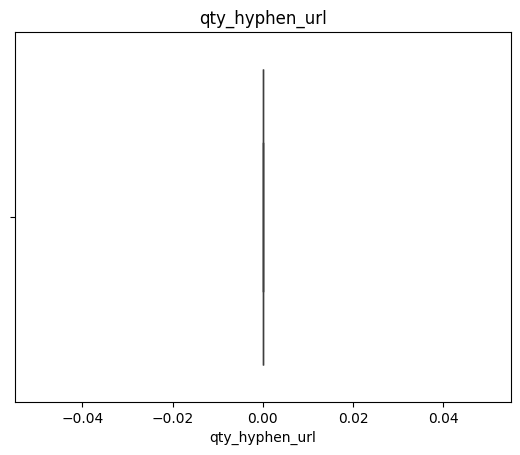

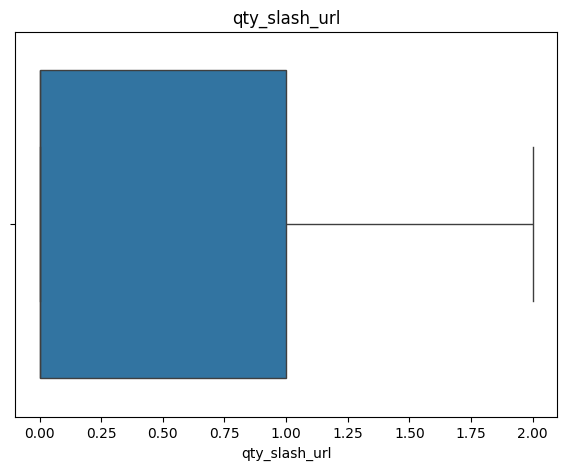

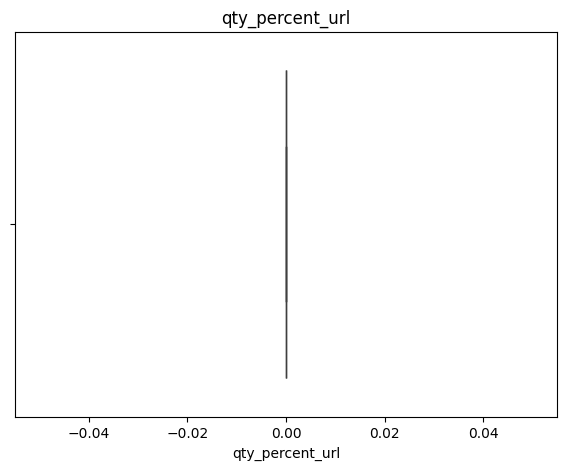

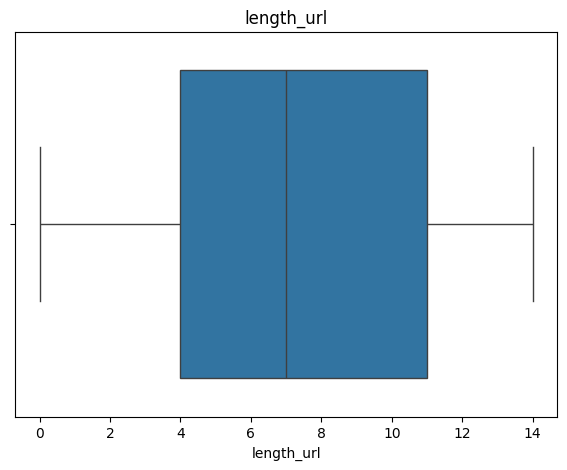

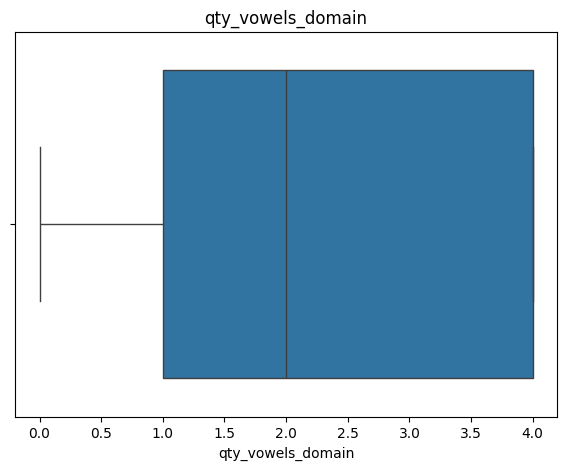

...

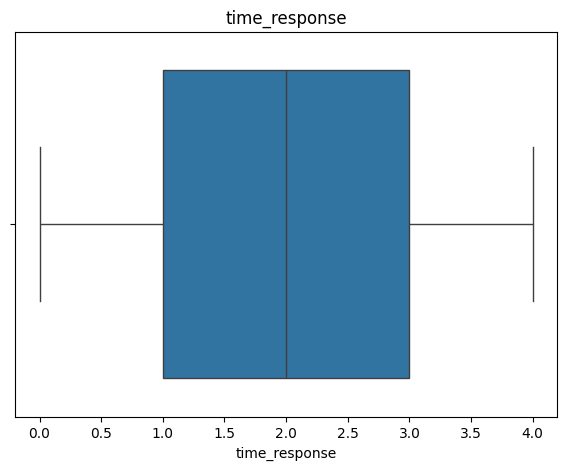

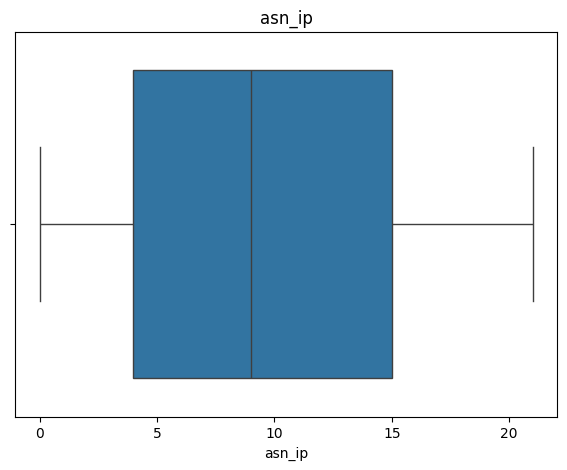

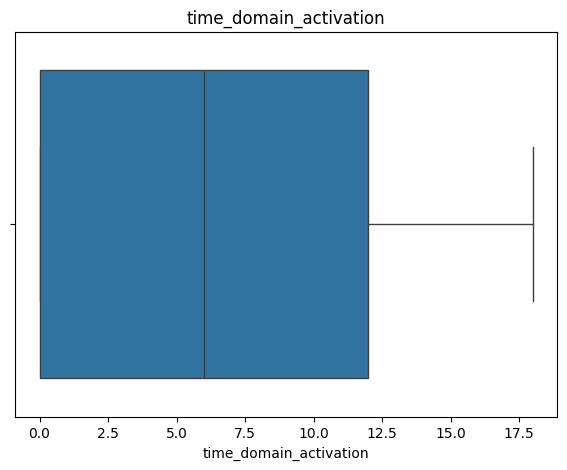

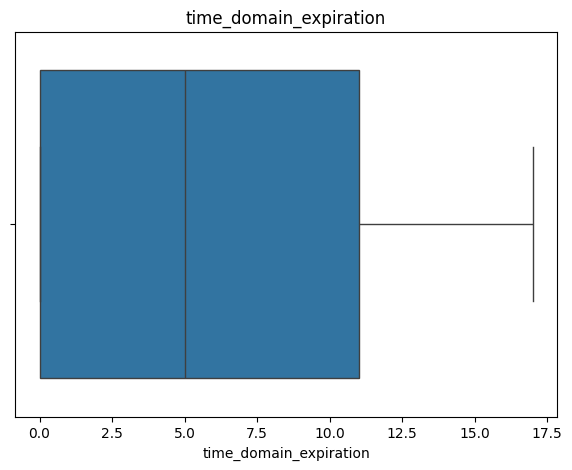

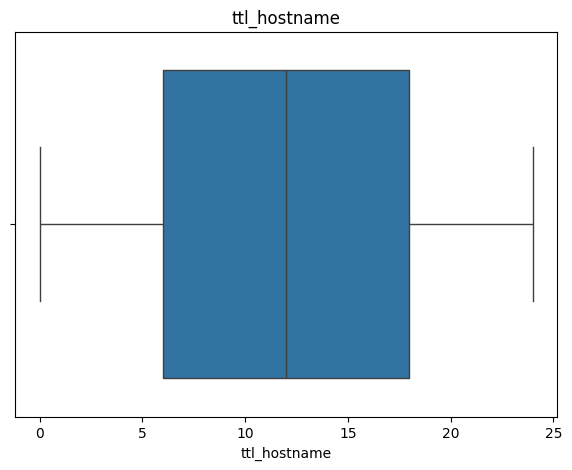

<Figure size 700x500 with 0 Axes>

In [ ]:
for feature in continuous_features:
    data=train_1_binned.copy()
    sns.boxplot(x=data[feature])
    plt.title(feature)
    plt.figure(figsize=(7,5))

In [ ]:
#outliers still found after binning in continuous features

<ipython-input-35-d27ba8344f8a>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(7,5))


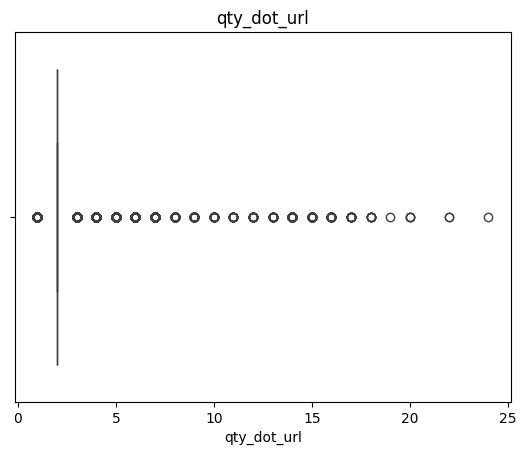

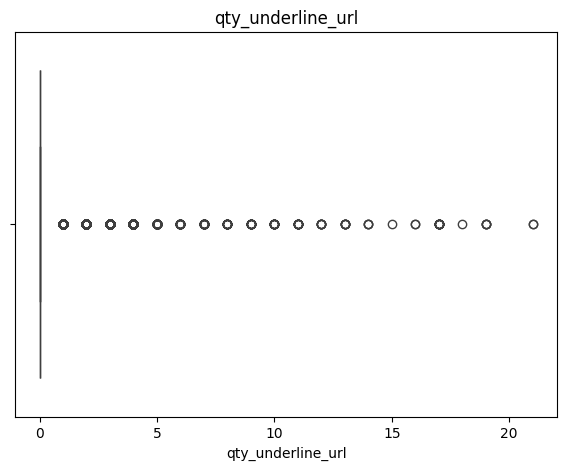

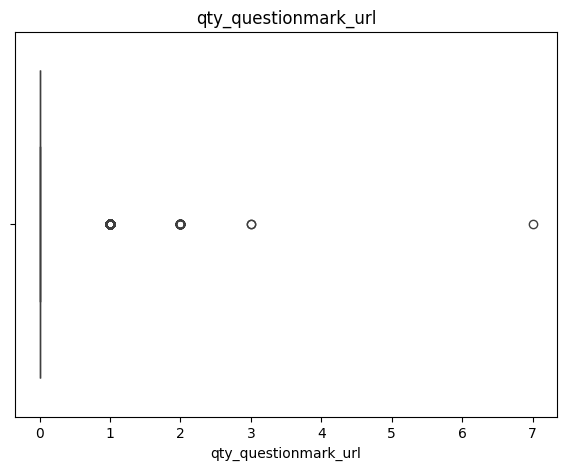

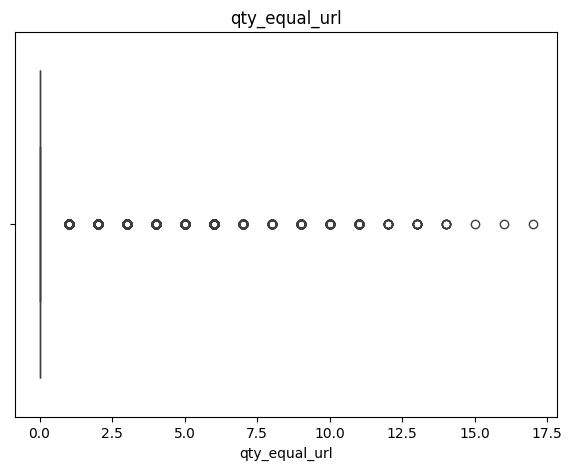

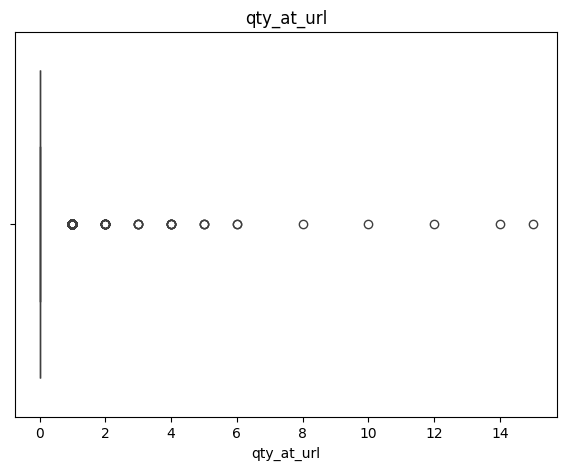

...

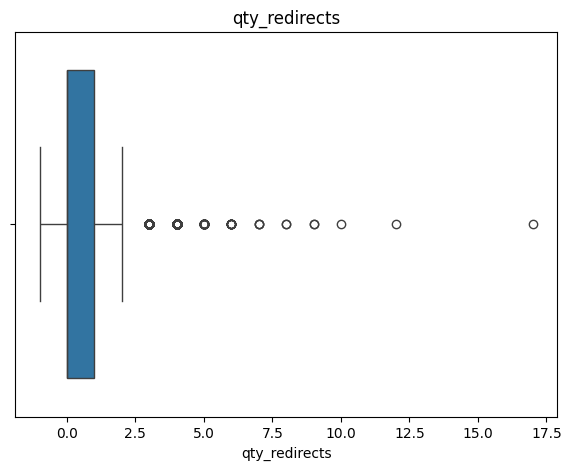

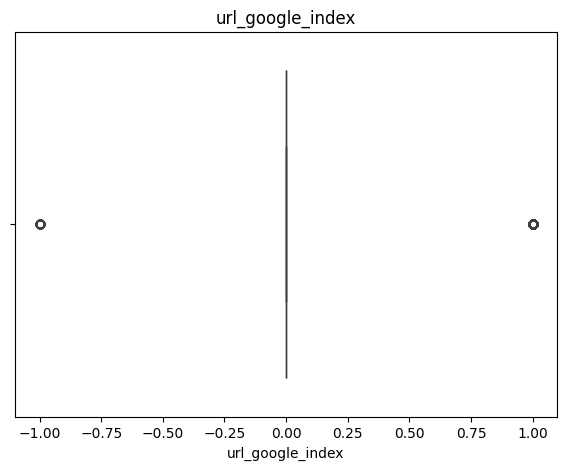

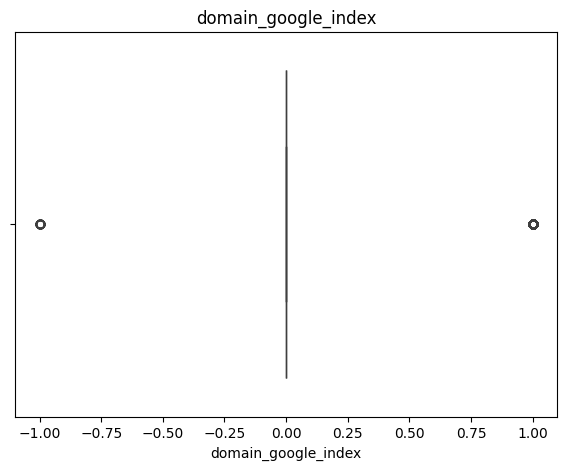

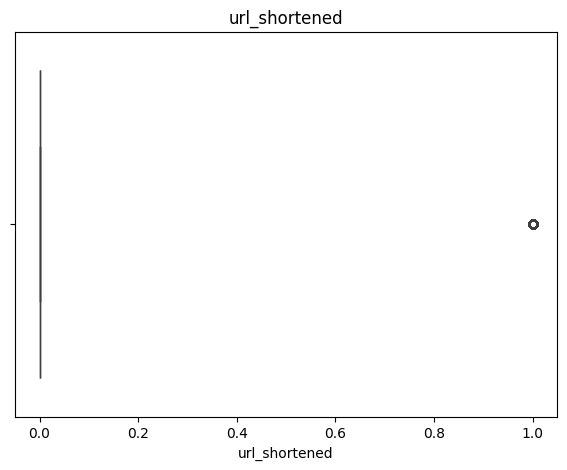

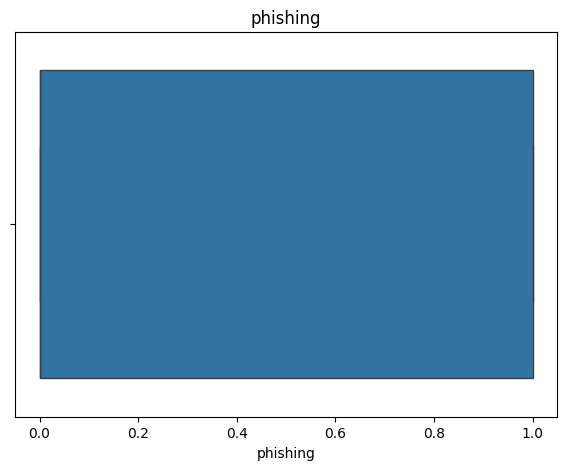

<Figure size 700x500 with 0 Axes>

In [ ]:
for feature in discrete_features:
    data=train_1_binned.copy()
    sns.boxplot(x=data[feature])
    plt.title(feature)
    plt.figure(figsize=(7,5))

In [ ]:
#outlier treatment via capping is needed

In [ ]:
def cap_outliers_iqr(data):
    # Exclude 'phishing' from transformation
    data_to_transform = data.drop(columns=['phishing'], errors='ignore')

    # Calculate IQR and cap outliers for each column
    Q1 = data_to_transform.quantile(0.25)
    Q3 = data_to_transform.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    capped_data = data_to_transform.clip(lower=lower_bound, upper=upper_bound, axis=1)

    if 'phishing' in data.columns:
        capped_data['phishing'] = data['phishing']

    return capped_data

In [ ]:
transformer = FunctionTransformer(func=cap_outliers_iqr)
train_data_capped = transformer.fit_transform(train_1_binned)

In [ ]:
test_data_capped = transformer.transform(test_1_binned)

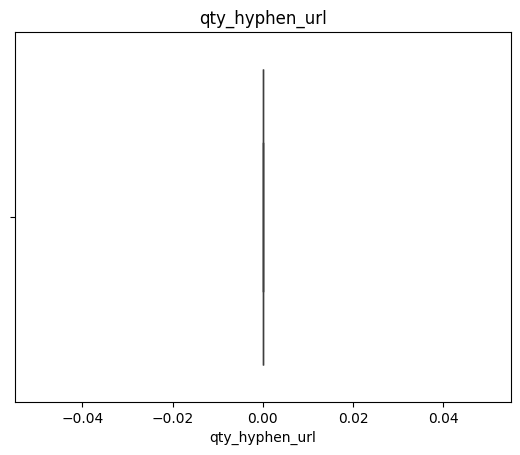

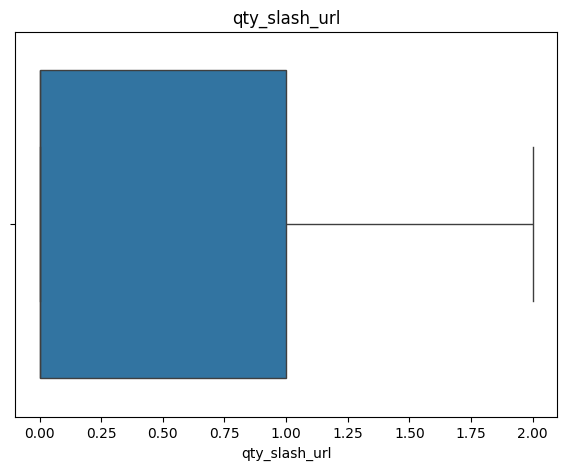

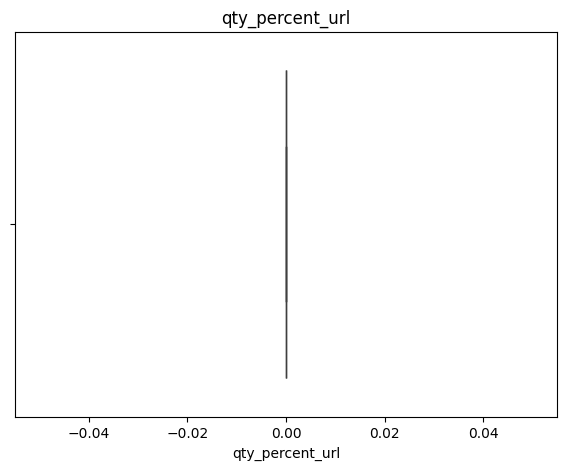

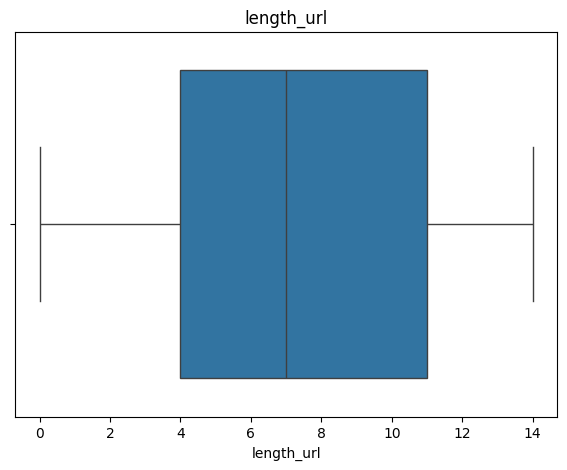

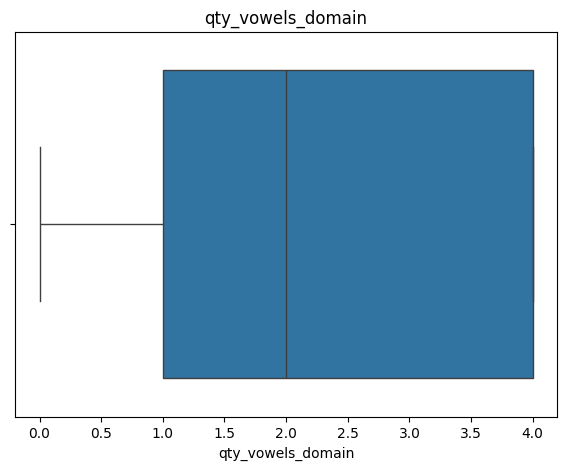

...

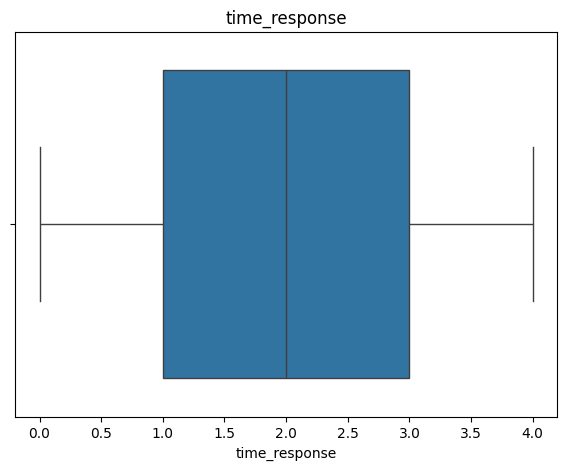

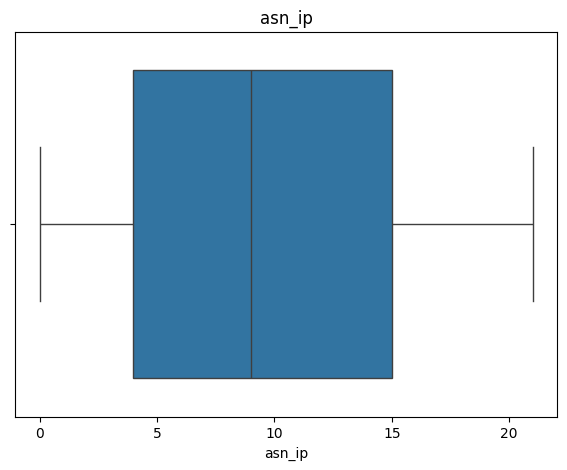

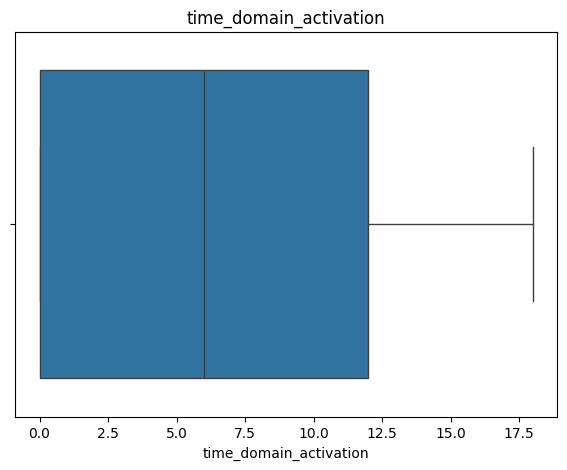

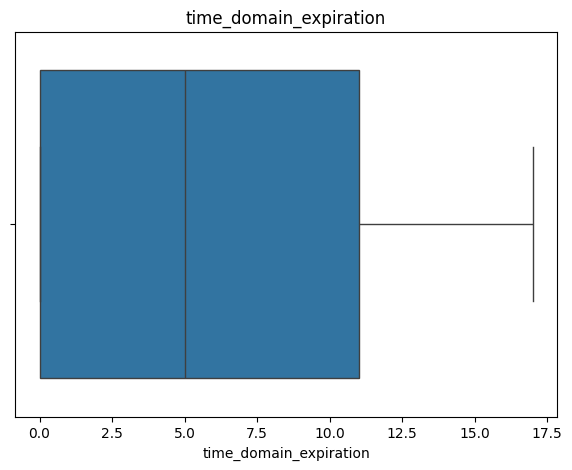

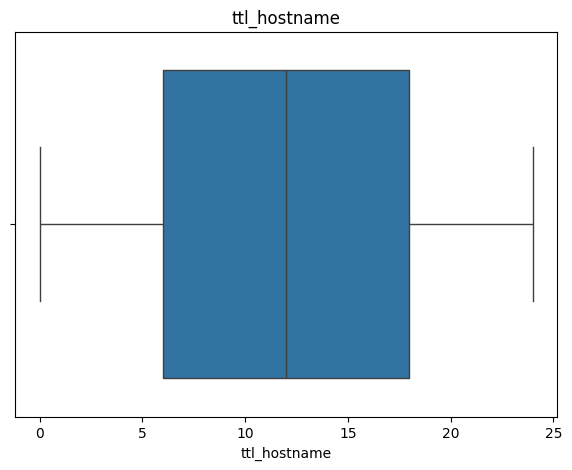

<Figure size 700x500 with 0 Axes>

In [ ]:
#visualising no outliers

for feature in continuous_features:
    data=train_data_capped.copy()
    sns.boxplot(x=data[feature])
    plt.title(feature)
    plt.figure(figsize=(7,5))

<ipython-input-86-ab9f747dfa5c>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(7,5))


KeyError: 'phishing'

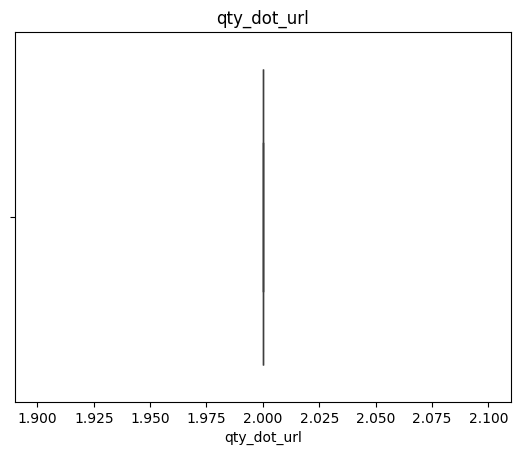

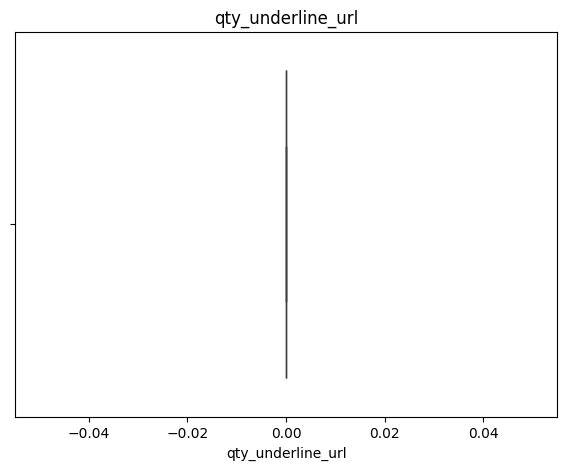

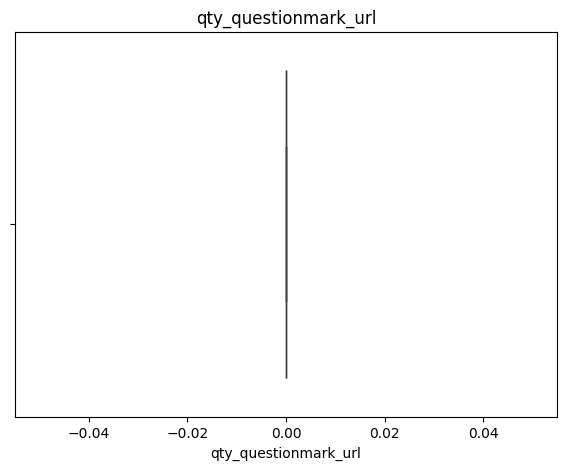

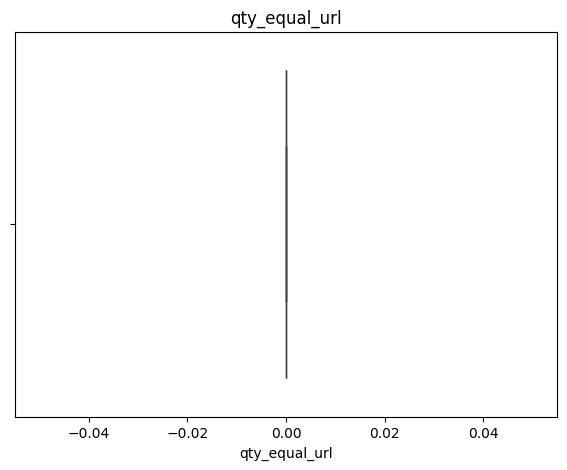

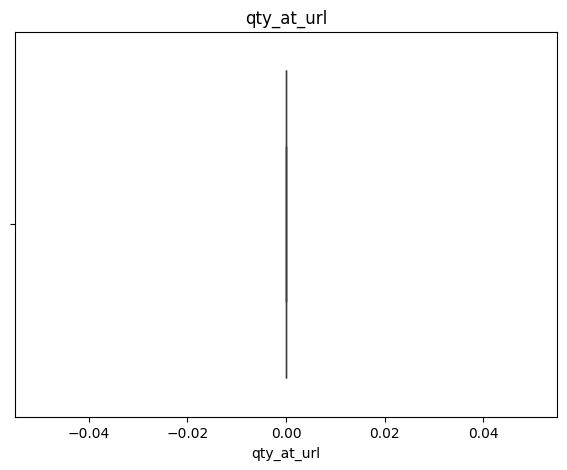

...

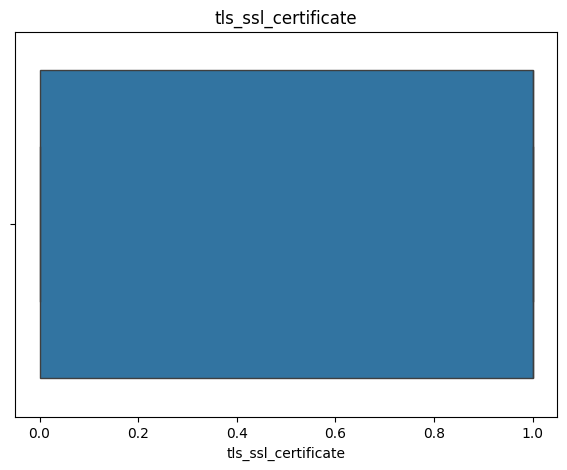

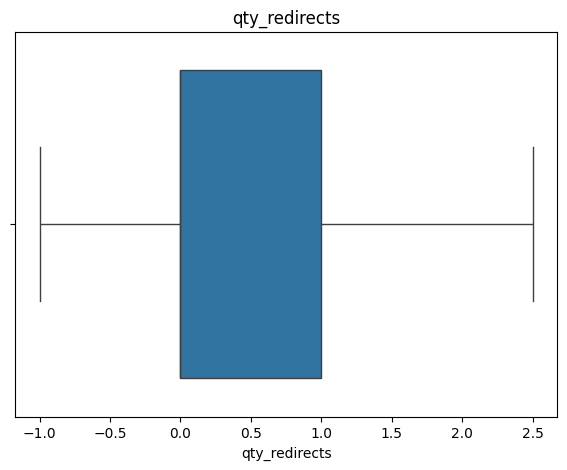

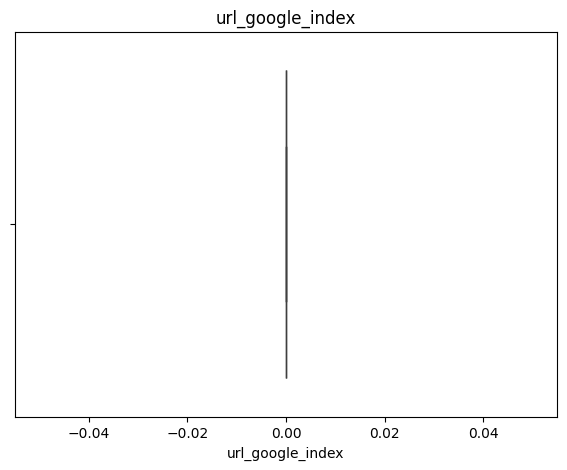

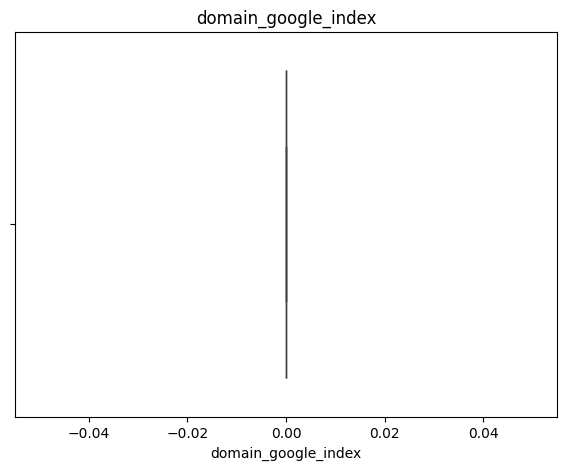

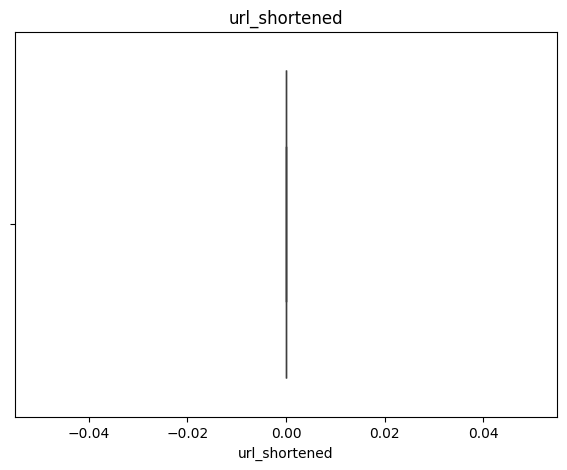

<Figure size 700x500 with 0 Axes>

In [ ]:
for feature in discrete_features:
    data=train_data_capped.copy()
    sns.boxplot(x=data[feature])
    plt.title(feature)
    plt.figure(figsize=(7,5))

In [ ]:
train_data_capped.shape

(61161, 112)

In [ ]:
train_data_capped.head()

,qty_dot_url,qty_underline_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_tld_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_dot_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,tld_present_params,qty_params,email_in_url,domain_spf,qty_ip_resolved,qty_nameservers,qty_mx_servers,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened,qty_hyphen_url,qty_slash_url,qty_percent_url,length_url,qty_vowels_domain,domain_length,qty_percent_directory,directory_length,qty_percent_file,file_length,qty_hyphen_params,qty_percent_params,params_length,time_response,asn_ip,time_domain_activation,time_domain_expiration,ttl_hostname,phishing
0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.5,1.5,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.5,1.5,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,14.0,4.0,8.0,1.0,6.0,1.0,2.5,0.0,0.0,0.0,4.0,6.0,0.0,0.0,4.0,1.0
1,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,1.0,4.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,14.0,4.0,5.0,1.0,3.0,1.0,2.5,0.0,0.0,0.0,3.0,2.0,8.0,4.0,16.0,1.0
2,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,1.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,4.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,4.0,0.0,0.0,6.0,0.0
3,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,1.0,3.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,2.0,16.0,12.0,1.0,22.0,0.0
4,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [ ]:
for feature in continuous_features:
  skewness = train_data_capped[feature].skew()
  print(f"Skewness of {feature}: {skewness}")

Skewness of qty_hyphen_url: 0
Skewness of qty_slash_url: 0.619533776833089
Skewness of qty_percent_url: 0
Skewness of length_url: -0.027844653885930985
Skewness of qty_vowels_domain: -0.0567851682307578
Skewness of domain_length: -0.15247148051723267
Skewness of qty_percent_directory: 0.1259860130574711
Skewness of directory_length: 1.0825084162537064
Skewness of qty_percent_file: 0.1259860130574711
Skewness of file_length: 0.8594830107567232
Skewness of qty_hyphen_params: 0
Skewness of qty_percent_params: 0
Skewness of params_length: 0
Skewness of time_response: -2.3123934064942677e-05
Skewness of asn_ip: 0.1573975377890008
Skewness of time_domain_activation: 0.3413612585892602
Skewness of time_domain_expiration: 0.4213767788576844
Skewness of ttl_hostname: -0.012325482678262206


In [ ]:
for feature in discrete_features:
  skewness = train_data_capped[feature].skew()
  print(f"Skewness of {feature}: {skewness}")

Skewness of qty_dot_url: 0
Skewness of qty_underline_url: 0
Skewness of qty_questionmark_url: 0
Skewness of qty_equal_url: 0
Skewness of qty_at_url: 0
Skewness of qty_and_url: 0
Skewness of qty_exclamation_url: 0
Skewness of qty_space_url: 0
Skewness of qty_tilde_url: 0
Skewness of qty_comma_url: 0
Skewness of qty_plus_url: 0
Skewness of qty_asterisk_url: 0
Skewness of qty_hashtag_url: 0
Skewness of qty_dollar_url: 0
Skewness of qty_tld_url: 0
Skewness of qty_dot_domain: 0.24539271479541183
Skewness of qty_hyphen_domain: 0
Skewness of qty_underline_domain: 0
Skewness of qty_slash_domain: 0
Skewness of qty_questionmark_domain: 0
Skewness of qty_equal_domain: 0
Skewness of qty_at_domain: 0
Skewness of qty_and_domain: 0
Skewness of qty_exclamation_domain: 0
Skewness of qty_space_domain: 0
Skewness of qty_tilde_domain: 0
Skewness of qty_comma_domain: 0
Skewness of qty_plus_domain: 0
Skewness of qty_asterisk_domain: 0
Skewness of qty_hashtag_domain: 0
Skewness of qty_dollar_domain: 0
Skewne

# Feature selection

In [ ]:
target_column = 'phishing'
train_features = train_data_capped.drop(columns=[target_column])
train_target = train_data_capped[[target_column]]

test_features = test_data_capped.drop(columns=[target_column])
test_target = test_data_capped[[target_column]]

In [ ]:
train_data_capped.describe()

,qty_dot_url,qty_underline_url,qty_questionmark_url,qty_equal_url,qty_at_url,qty_and_url,qty_exclamation_url,qty_space_url,qty_tilde_url,qty_comma_url,qty_plus_url,qty_asterisk_url,qty_hashtag_url,qty_dollar_url,qty_tld_url,qty_dot_domain,qty_hyphen_domain,qty_underline_domain,qty_slash_domain,qty_questionmark_domain,qty_equal_domain,qty_at_domain,qty_and_domain,qty_exclamation_domain,qty_space_domain,qty_tilde_domain,qty_comma_domain,qty_plus_domain,qty_asterisk_domain,qty_hashtag_domain,qty_dollar_domain,qty_percent_domain,domain_in_ip,server_client_domain,qty_dot_directory,qty_hyphen_directory,qty_underline_directory,qty_slash_directory,qty_questionmark_directory,qty_equal_directory,qty_at_directory,qty_and_directory,qty_exclamation_directory,qty_space_directory,qty_tilde_directory,qty_comma_directory,qty_plus_directory,qty_asterisk_directory,qty_hashtag_directory,qty_dollar_directory,qty_dot_file,qty_hyphen_file,qty_underline_file,qty_slash_file,qty_questionmark_file,qty_equal_file,qty_at_file,qty_and_file,qty_exclamation_file,qty_space_file,qty_tilde_file,qty_comma_file,qty_plus_file,qty_asterisk_file,qty_hashtag_file,qty_dollar_file,qty_dot_params,qty_underline_params,qty_slash_params,qty_questionmark_params,qty_equal_params,qty_at_params,qty_and_params,qty_exclamation_params,qty_space_params,qty_tilde_params,qty_comma_params,qty_plus_params,qty_asterisk_params,qty_hashtag_params,qty_dollar_params,tld_present_params,qty_params,email_in_url,domain_spf,qty_ip_resolved,qty_nameservers,qty_mx_servers,tls_ssl_certificate,qty_redirects,url_google_index,domain_google_index,url_shortened,qty_hyphen_url,qty_slash_url,qty_percent_url,length_url,qty_vowels_domain,domain_length,qty_percent_directory,directory_length,qty_percent_file,file_length,qty_hyphen_params,qty_percent_params,params_length,time_response,asn_ip,time_domain_activation,time_domain_expiration,ttl_hostname,phishing
count,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.000000,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.0,61161.000000,61161.000000,61161.000000,61161.000000,61161.0,61161.0,61161.0,61161.0,61161.000000,61161.0,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.0,61161.0,61161.0,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000,61161.000000
mean,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.851400,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.347967,-0.433806,-0.488457,0.698403,-0.531433,-0.525171,-0.529708,-0.528785,-0.530011,-0.531123,-0.528629,-0.531074,-0.530935,-0.530616,-0.531433,-0.530943,-0.367996,-0.506352,-0.514135,-0.531433,-0.531433,-0.529954,-0.531066,-0.530134,-0.530362,-0.531278,-0.531172,-0.531205,-0.531090,-0.531237,-0.531433,-0.531433,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,1.0,2.733458,1.487696,0.512598,0.348825,0.0,0.0,0.0,0.0,0.690865,0.0,7.232321,2.278756,4.781478,0.468567,1.488661,0.468567,0.763673,0.0,0.0,0.0,2.000033,9.734962,6.841598,6.129118,12.088161,0.350158
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.615577,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.781208,0.679902,0.586875,2.119

In [ ]:
#Consistent Feature Importance: Many feature selection methods (like those based on variance,
#mutual information, or certain embedded methods) assume that features are on a similar scale.
#If features have different scales, the method might wrongly interpret the importance of a
#feature with larger values as more significant than it actually is.
#Techniques like Principal Component Analysis (PCA) and methods that use variance
#(like VarianceThreshold) assume that all features contribute equally to the variance.
#If the data is not scaled, features with larger ranges will dominate the calculation of variance.


In [ ]:
#If your features are already binned or are discrete, scaling is generally not required. Here’s why:

#Binned Features:
#When features are binned, they represent categorical-like data where each bin has a certain range
#of values. Scaling these doesn't make sense as the relationship between bins is not linear.

#Discrete Features:
#Discrete features with a limited range of values (e.g., 0 to 20) don't benefit from scaling in most
#cases, especially if they represent categorical-like information.

In [ ]:
variance_threshold = 0.05
selector = VarianceThreshold(threshold=variance_threshold)

In [ ]:
train_varselc = selector.fit_transform(train_features)
test_varselc = selector.transform(test_features)

###Train

In [ ]:
selected_features1 = train_features.columns[selector.get_support()]
selected_features1

Index(['qty_dot_domain', 'qty_dot_directory', 'qty_hyphen_directory',
       'qty_underline_directory', 'qty_slash_directory',
       'qty_questionmark_directory', 'qty_equal_directory', 'qty_at_directory',
       'qty_and_directory', 'qty_exclamation_directory', 'qty_space_directory',
       'qty_tilde_directory', 'qty_comma_directory', 'qty_plus_directory',
       'qty_asterisk_directory', 'qty_hashtag_directory',
       'qty_dollar_directory', 'qty_dot_file', 'qty_hyphen_file',
       'qty_underline_file', 'qty_slash_file', 'qty_questionmark_file',
       'qty_equal_file', 'qty_at_file', 'qty_and_file', 'qty_exclamation_file',
       'qty_space_file', 'qty_tilde_file', 'qty_comma_file', 'qty_plus_file',
       'qty_asterisk_file', 'qty_hashtag_file', 'qty_dollar_file',
       'qty_nameservers', 'qty_mx_servers', 'tls_ssl_certificate',
       'qty_redirects', 'qty_slash_url', 'length_url', 'qty_vowels_domain',
       'domain_length', 'qty_percent_directory', 'directory_length',
     

In [ ]:
tr= train_data_capped[selected_features1]
tr.shape

(61161, 50)

In [ ]:
new_train =pd.concat([train_data_capped[selected_features1],train_target],axis=1)
new_train.shape

(61161, 51)

###Test

In [ ]:
tt= test_data_capped[selected_features1]
tt.shape

(26333, 50)

In [ ]:
new_test= pd.concat([test_data_capped[selected_features1],test_target],axis=1)
new_test.shape

(26333, 51)

<Axes: >

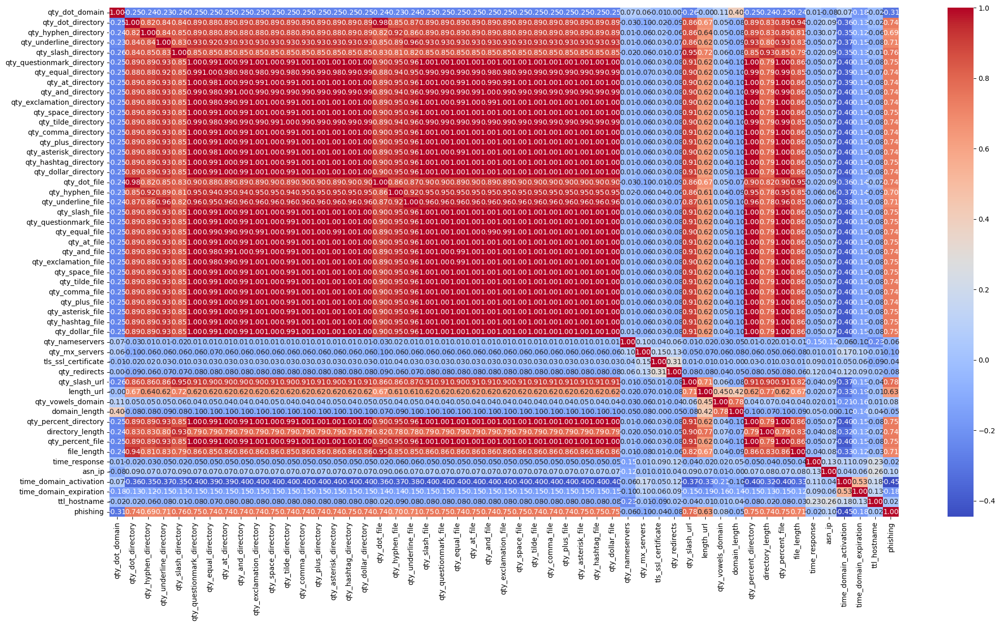

In [ ]:
correlation_matrix = new_train.corr()
plt.figure(figsize=(25, 13))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

In [ ]:
# Separate features and target
features = new_train.columns.difference(['phishing'])  # Assuming 'target' is the name of the target column
train_features = new_train[features]
train_target = new_train['phishing']

# Calculate the correlation matrix for features
corr_matrix = train_features.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Calculate correlation of each feature with the target variable
target_corr = train_features.apply(lambda x: x.corr(train_target))

# Initialize the set to hold columns to drop
to_drop = set()

# Iterate over the columns in the upper triangle correlation matrix
for column in upper.columns:
    high_corr_features = [index for index in upper.index if upper.loc[index, column] > 0.85]
    if high_corr_features:
        for feature in high_corr_features:
            if target_corr[feature] < target_corr[column]:
                to_drop.add(feature)
            else:
                to_drop.add(column)

# Drop the identified highly correlated features
train_selected_x = train_features.drop(columns=to_drop)
test_selected_x = new_test[train_selected_x.columns]  # Ensure test data has the same columns as the selected train data

# Combine the selected features with the target
train_selected1 = pd.concat([train_selected_x, train_target], axis=1)
test_selected1 = pd.concat([test_selected_x, test_target], axis=1)

In [ ]:
train_selected1.columns

Index(['asn_ip', 'domain_length', 'length_url', 'qty_dot_domain',
       'qty_mx_servers', 'qty_nameservers', 'qty_redirects', 'qty_slash_url',
       'qty_vowels_domain', 'time_domain_activation', 'time_domain_expiration',
       'time_response', 'tls_ssl_certificate', 'ttl_hostname', 'phishing'],
      dtype='object')

In [ ]:
test_selected1.columns

Index(['asn_ip', 'domain_length', 'length_url', 'qty_dot_domain',
       'qty_mx_servers', 'qty_nameservers', 'qty_redirects', 'qty_slash_url',
       'qty_vowels_domain', 'time_domain_activation', 'time_domain_expiration',
       'time_response', 'tls_ssl_certificate', 'ttl_hostname', 'phishing'],
      dtype='object')

In [ ]:
#Create a preprocessing pipeline of all the preprocessing steps done so far
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer


##Lasso

In [ ]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler

In [ ]:
new_train.shape

(61161, 51)

In [ ]:
train_featuress = new_train.drop(columns=['phishing'])
train_targett = new_train['phishing']

test_featuress = new_test.drop(columns=['phishing'])
test_targett = new_test['phishing']

# Standardize features
scaler = StandardScaler()
train_features_scaled = scaler.fit_transform(train_featuress)
test_features_scaled = scaler.transform(test_featuress)

# Initialize Lasso with a specific alpha (regularization strength)
lasso = Lasso(alpha=0.1)  # Adjust alpha as needed

# Fit Lasso on the training data
lasso.fit(train_features_scaled, train_targett)

# Get the selected features (non-zero coefficients)
selected_features = [feature for feature, coef in zip(train_featuress.columns, lasso.coef_) if coef != 0]

# Create new training and test sets with selected features
train_refiltered = new_train[selected_features + ['phishing']]
test_refiltered = new_test[selected_features + ['phishing']]

In [ ]:
train_refiltered.shape

(61161, 9)

In [ ]:
test_refiltered.shape

(26333, 9)

<Axes: >

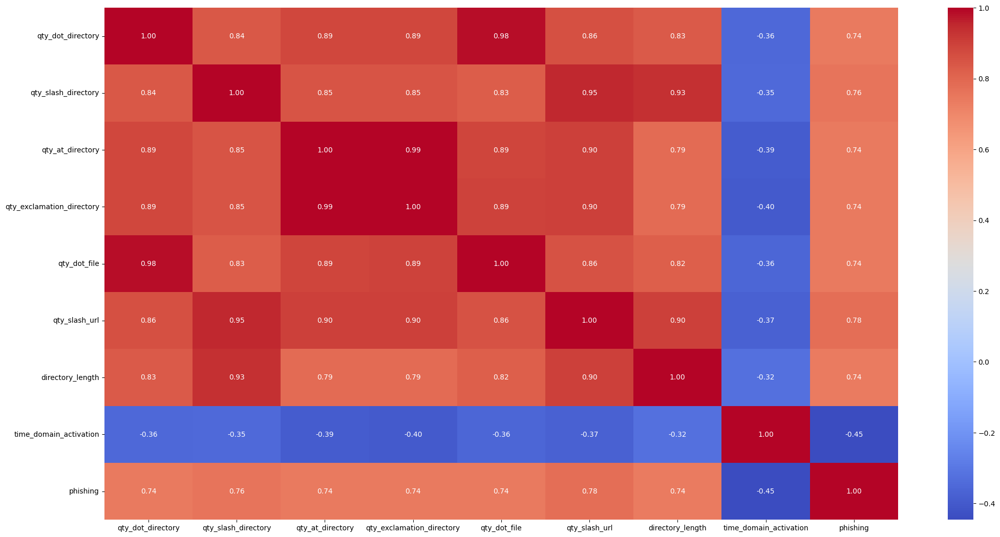

In [ ]:
correlation_matrix = train_refiltered.corr()
plt.figure(figsize=(25, 13))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

In [ ]:
train_refiltered.columns

Index(['qty_dot_directory', 'qty_slash_directory', 'qty_at_directory',
       'qty_exclamation_directory', 'qty_dot_file', 'qty_slash_url',
       'directory_length', 'time_domain_activation', 'phishing'],
      dtype='object')

In [ ]:
train_features = train_refiltered.drop(columns=['phishing'])
train_target = train_refiltered['phishing']

test_features = test_refiltered.drop(columns=['phishing'])
test_target = test_refiltered['phishing']

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report,confusion_matrix

In [ ]:
# Initialize Logistic Regression model
logreg = LogisticRegression()

# Fit the model on the training data
logreg.fit(train_features, train_target)

# Predict on the test data
y_pred = logreg.predict(test_features)

# Calculate metrics
precision = precision_score(test_target, y_pred, average='binary')
recall = recall_score(test_target, y_pred, average='binary')
accuracy = accuracy_score(test_target, y_pred)
f1 = f1_score(test_target, y_pred, average='binary')

# Print metrics
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'Accuracy: {accuracy:.2f}')
print(f'F1 Score: {f1:.2f}')

# Classification report
print('\nClassification Report:\n', classification_report(test_target, y_pred))

Precision: 0.83
Recall: 0.92
Accuracy: 0.91
F1 Score: 0.88

Classification Report:
               precision    recall  f1-score   support

         0.0       0.96      0.90      0.93     17219
         1.0       0.83      0.92      0.88      9114

    accuracy                           0.91     26333
   macro avg       0.90      0.91      0.90     26333
weighted avg       0.91      0.91      0.91     26333



#Continued

In [ ]:
# Separate features and target
features = new_train.columns.difference(['phishing'])  # Assuming 'target' is the name of the target column
train_features = new_train[features]
train_target = new_train['phishing']

# Calculate the correlation matrix for features
corr_matrix = train_features.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Calculate correlation of each feature with the target variable
target_corr = train_features.apply(lambda x: x.corr(train_target))

# Initialize the set to hold columns to drop
to_drop = set()

# Iterate over the columns in the upper triangle correlation matrix
for column in upper.columns:
    high_corr_features = [index for index in upper.index if upper.loc[index, column] > 0.85]
    if high_corr_features:
        for feature in high_corr_features:
            if target_corr[feature] < target_corr[column]:
                to_drop.add(feature)
            else:
                to_drop.add(column)

# Drop the identified highly correlated features
train_selected_x = train_features.drop(columns=to_drop)
test_selected_x = new_test[train_selected_x.columns]  # Ensure test data has the same columns as the selected train data

# Combine the selected features with the target
train_selected1 = pd.concat([train_selected_x, train_target], axis=1)
test_selected1 = pd.concat([test_selected_x, test_target], axis=1)

In [ ]:
train_selected1.columns

Index(['asn_ip', 'domain_length', 'length_url', 'qty_dot_domain',
       'qty_mx_servers', 'qty_nameservers', 'qty_redirects', 'qty_slash_url',
       'qty_vowels_domain', 'time_domain_activation', 'time_domain_expiration',
       'time_response', 'tls_ssl_certificate', 'ttl_hostname', 'phishing'],
      dtype='object')

In [ ]:
test_selected1.columns

Index(['asn_ip', 'domain_length', 'length_url', 'qty_dot_domain',
       'qty_mx_servers', 'qty_nameservers', 'qty_redirects', 'qty_slash_url',
       'qty_vowels_domain', 'time_domain_activation', 'time_domain_expiration',
       'time_response', 'tls_ssl_certificate', 'ttl_hostname', 'phishing'],
      dtype='object')

<Axes: >

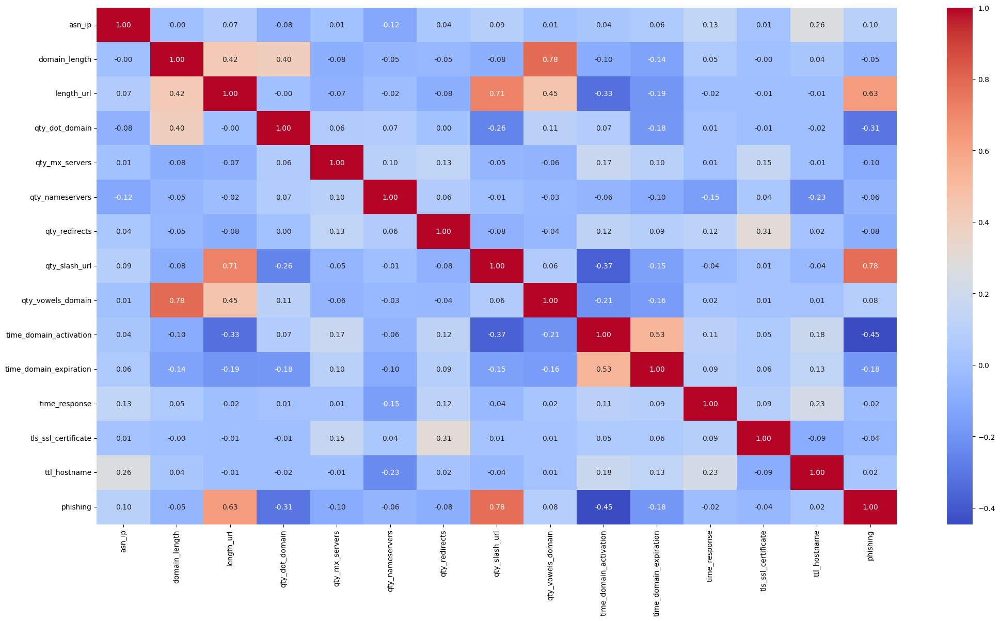

In [ ]:
correlation_matrix = train_selected1.corr()
plt.figure(figsize=(25, 13))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report,confusion_matrix

In [ ]:
# Initialize Logistic Regression model
logreg = LogisticRegression()

# Fit the model on the training data
logreg.fit(train_selected_x, train_target)

# Predict on the test data
y_pred = logreg.predict(test_selected_x)

# Calculate metrics
precision = precision_score(test_target, y_pred, average='binary')
recall = recall_score(test_target, y_pred, average='binary')
accuracy = accuracy_score(test_target, y_pred)
f1 = f1_score(test_target, y_pred, average='binary')

# Print metrics
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'Accuracy: {accuracy:.2f}')
print(f'F1 Score: {f1:.2f}')

# Classification report
print('\nClassification Report:\n', classification_report(test_target, y_pred))

Precision: 0.89
Recall: 0.88
Accuracy: 0.92
F1 Score: 0.89

Classification Report:
               precision    recall  f1-score   support

         0.0       0.94      0.94      0.94     17219
         1.0       0.89      0.88      0.89      9114

    accuracy                           0.92     26333
   macro avg       0.91      0.91      0.91     26333
weighted avg       0.92      0.92      0.92     26333



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


#Other feature selection scores

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif, SelectKBest, chi2, RFE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from sklearn.pipeline import Pipeline

In [ ]:
# Define different feature selection methods
feature_selection_methods = {
    'SelectKBestMI': SelectKBest(mutual_info_classif, k=10),
    'RFE': RFE(estimator=LogisticRegression(), n_features_to_select=10)
    }

# Evaluate performance for each feature selection method
for name, selector in feature_selection_methods.items():
    # Create pipeline with feature selection and classifier
    pipeline = Pipeline([
        ('feature selector', selector),
        ('classifier', LogisticRegression())
    ])

    # Fit the pipeline on the training data
    pipeline.fit(tr, train_target)

    # Predict on the test data
    y_pred = pipeline.predict(tt)

    # Calculate the F1 score
    f1 = f1_score(test_target, y_pred)

    # Print the F1 score
    print(f"F1 score using {name}: {f1:.4f}")

SelectKBestMI: 0.8321

RFE: 0.8424



In [ ]:
selected_features

Index(['qty_dot_domain', 'qty_dot_directory', 'qty_slash_directory',
       'qty_equal_directory', 'qty_and_directory', 'qty_exclamation_directory',
       'qty_space_directory', 'qty_hyphen_file', 'qty_exclamation_file',
       'qty_slash_url', 'length_url', 'domain_length', 'directory_length',
       'file_length', 'asn_ip', 'time_domain_activation',
       'time_domain_expiration', 'ttl_hostname'],
      dtype='object')

In [ ]:
#If you plan to use logistic regression or any other linear model, the customized method that
#avoids high multicollinearity might be more appropriate.If you plan to use tree-based models
#primarily, the impact of multicollinearity is less concerning, and you can still use the Random Forest
#method. However, if the performance difference is negligible, it is usually better to avoid
#multicollinearity.

#Finding best model

In [ ]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.metrics import f1_score

In [ ]:
train_selected_x, train_target

In [ ]:
classifiers = {
    'SVM': SVC(),
    'XGBoost': XGBClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Adaboost': AdaBoostClassifier()
}

results = {}
for clf_name, clf in classifiers.items():

    clf.fit(train_selected_x,train_target)

    # Predict on the test set
    y_pred = clf.predict(test_selected_x)

    # Calculate F1 score
    f1 = f1_score(test_target, y_pred)

    # Store the results
    results[clf_name] = f1

# Print results
for clf_name, f1 in results.items():
    print(f'{clf_name}: {f1}')

SVM: 0.9146348175463702
XGBoost: 0.9472538239616788
Gradient Boosting: 0.9175050301810865
Random Forest: 0.9510810220572178
Adaboost: 0.8951552261252551


##HYPM Tuning

In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 20.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 9.1 MB/s eta 0:00:00


In [ ]:
from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import cross_val_score
import optuna

In [ ]:
train_selected_x, train_target
test_selected_x, test_target

In [ ]:
# F1 scorer
f1_scorer = make_scorer(f1_score, average='weighted')

# Define objective functions for each model

def objective_svm(trial):
    kernel = trial.suggest_categorical('kernel', ['linear', 'rbf'])
    C = trial.suggest_loguniform('C', 1e-5, 1e2)
    gamma = 'scale' if kernel == 'linear' else trial.suggest_loguniform('gamma', 1e-5, 1e1)
    clf = SVC(kernel=kernel, C=C, gamma=gamma)
    return cross_val_score(clf, train_selected_x, train_target, cv=3, scoring=f1_scorer, n_jobs=-1).mean()

def objective_xgb(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'max_depth': trial.suggest_int('max_depth', 1, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
        'colsample_bylevel': trial.suggest_uniform('colsample_bylevel', 0.5, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10)
    }
    clf = XGBClassifier(**param)
    return cross_val_score(clf, train_selected_x, train_target, cv=3, n_jobs=-1, scoring=f1_scorer).mean()

def objective_gbm(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'max_depth': trial.suggest_int('max_depth', 1, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['auto', 'sqrt', 'log2'])
    }
    clf = GradientBoostingClassifier(**param)
    return cross_val_score(clf, train_selected_x, train_target, cv=3, n_jobs=-1, scoring=f1_scorer).mean()

def objective_rf(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'max_depth': trial.suggest_int('max_depth', 1, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['auto', 'sqrt', 'log2'])
    }
    clf = RandomForestClassifier(**param)
    return cross_val_score(clf, train_selected_x, train_target, cv=3, n_jobs=-1, scoring=f1_scorer).mean()

def objective_adaboost(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
        'algorithm': trial.suggest_categorical('algorithm', ['SAMME', 'SAMME.R'])
    }
    clf = AdaBoostClassifier(**param)
    return cross_val_score(clf, train_selected_x, train_target, cv=3, n_jobs=-1, scoring=f1_scorer).mean()

# Optimize hyperparameters for each model
study_svm = optuna.create_study(direction='maximize')
study_svm.optimize(objective_svm, n_trials=15)

study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective_xgb, n_trials=40)

study_gbm = optuna.create_study(direction='maximize')
study_gbm.optimize(objective_gbm, n_trials=30)

study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_rf, n_trials=40)

study_adaboost = optuna.create_study(direction='maximize')
study_adaboost.optimize(objective_adaboost, n_trials=35)

# Best parameters and scores
print("Best SVM parameters: ", study_svm.best_params)
print("Best SVM score: ", study_svm.best_value)

print("Best XGBoost parameters: ", study_xgb.best_params)
print("Best XGBoost score: ", study_xgb.best_value)

print("Best GBM parameters: ", study_gbm.best_params)
print("Best GBM score: ", study_gbm.best_value)

print("Best Random Forest parameters: ", study_rf.best_params)
print("Best Random Forest score: ", study_rf.best_value)

print("Best AdaBoost parameters: ", study_adaboost.best_params)
print("Best AdaBoost score: ", study_adaboost.best_value)

# Train and evaluate the best models on the test set
best_svm = SVC(**study_svm.best_params).fit(train_selected_x, train_target)
best_xgb = XGBClassifier(**study_xgb.best_params).fit(train_selected_x, train_target)
best_gbm = GradientBoostingClassifier(**study_gbm.best_params).fit(train_selected_x, train_target)
best_rf = RandomForestClassifier(**study_rf.best_params).fit(train_selected_x, train_target)
best_adaboost = AdaBoostClassifier(**study_adaboost.best_params).fit(train_selected_x, train_target)

print("Test F1 Score of SVM: ", f1_score(test_target, best_svm.predict(test_selected_x), average='weighted'))
print("Test F1 Score of XGBoost: ", f1_score(test_target, best_xgb.predict(test_selected_x), average='weighted'))
print("Test F1 Score of GBM: ", f1_score(test_target, best_gbm.predict(test_selected_x), average='weighted'))
print("Test F1 Score of Random Forest: ", f1_score(test_target, best_rf.predict(test_selected_x), average='weighted'))
print("Test F1 Score of AdaBoost: ", f1_score(test_target, best_adaboost.predict(test_selected_x), average='weighted'))

[I 2024-07-19 15:26:57,165] A new study created in memory with name: no-name-955cc2a8-b922-419a-9190-ed3c262fe072
<ipython-input-65-df3165087d98>:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 1e-5, 1e2)
[I 2024-07-19 15:28:41,171] Trial 0 finished with value: 0.9095211607466115 and parameters: {'kernel': 'linear', 'C': 0.00026650962583627967}. Best is trial 0 with value: 0.9095211607466115.
<ipython-input-65-df3165087d98>:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 1e-5, 1e2)
<ipython-input-65-df3165087d98>:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be 

Best SVM parameters:  {'kernel': 'rbf', 'C': 2.979181424871692, 'gamma': 0.011841923030890584}
Best SVM score:  0.9534614166418267
Best XGBoost parameters:  {'n_estimators': 213, 'max_depth': 10, 'learning_rate': 0.051584828056916034, 'subsample': 0.894170564946877, 'colsample_bytree': 0.7072766725914474, 'colsample_bylevel': 0.6527239221321376, 'min_child_weight': 2}
Best XGBoost score:  0.9643022745573008
Best GBM parameters:  {'n_estimators': 243, 'max_depth': 8, 'learning_rate': 0.09897396165104519, 'subsample': 0.8308214249634405, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto'}
Best GBM score:  0.9646600531492199
Best Random Forest parameters:  {'n_estimators': 292, 'max_depth': 19, 'min_samples_split': 14, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Best Random Forest score:  0.9588952908205307
Best AdaBoost parameters:  {'n_estimators': 113, 'learning_rate': 0.09970319503307522, 'algorithm': 'SAMME'}
Best AdaBoost score:  0.9174445078647576


/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/usr/local/lib/python3.10/di

Test F1 Score of SVM:  0.9552368102842773
Test F1 Score of XGBoost:  0.9658692458943455
Test F1 Score of GBM:  0.9674179620753374
Test F1 Score of Random Forest:  0.9608799687893059
Test F1 Score of AdaBoost:  0.9165088841877066


### Best Algorithm scores with their best hyperparameters

Best SVM parameters:  {'kernel': 'rbf', 'C': 2.979181424871692, 'gamma': 0.011841923030890584}
Best SVM score:  0.9534614166418267


Best XGBoost parameters:  {'n_estimators': 213, 'max_depth': 10, 'learning_rate': 0.051584828056916034, 'subsample': 0.894170564946877, 'colsample_bytree': 0.7072766725914474, 'colsample_bylevel': 0.6527239221321376, 'min_child_weight': 2}
Best XGBoost score:  0.9643022745573008


Best GBM parameters:  {'n_estimators': 243, 'max_depth': 8, 'learning_rate': 0.09897396165104519, 'subsample': 0.8308214249634405, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto'}
Best GBM score:  0.9674179620753374


Best Random Forest parameters:  {'n_estimators': 292, 'max_depth': 19, 'min_samples_split': 14, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
Best Random Forest score:  0.9588952908205307


Best AdaBoost parameters:  {'n_estimators': 113, 'learning_rate': 0.09970319503307522, 'algorithm': 'SAMME'}
Best AdaBoost score:  0.9174445078647576